# Исследование рынка заведений общественного питания Москвы

**Цель исследования:**
 
 Необходимо провести исследование рынка заведений общественного питания Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам из фонда «Shut Up and Take My Money» места.
 Впоследствии необходимо провести детализирванное исследование для целей выработки инвесторам рекомендаций для открытия кофейни.
 
**Исходные данные:**

Датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года (moscow_places.csv):
* name — название заведения;
* address — адрес заведения;
* category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
* hours — информация о днях и часах работы;
* lat — широта географической точки, в которой находится заведение;
* lng — долгота географической точки, в которой находится заведение;
* rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
* price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
* avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
** «Средний счёт: 1000–1500 ₽»;
** «Цена чашки капучино: 130–220 ₽»;
** «Цена бокала пива: 400–600 ₽».
и так далее;
* middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
** Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
** Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
** Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
* middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
** Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
** Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
** Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
* chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
** 0 — заведение не является сетевым
** 1 — заведение является сетевым
* district — административный район, в котором находится заведение, например Центральный административный округ;
* seats — количество посадочных мест.

**Ход исследования:**
 1) Обзор данных;
 
 2) Предобработка данных
 
 3) Анализ и исследование данных, выявление закономерностей;
 
 4) Общий вывод.
 
 5) *Дополнительное исследование:*
Изучение рынка кофеен, выработка рекомендаций по открытию новой кофейни.

 6) *Презентация проведенного исследования для инвесторов.*
 

 

## Обзор данных

In [1]:
# импортируем библиотеки
import pandas as pd
import datetime as dt
import numpy as np
import math as mth
import seaborn as sns
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
from scipy import stats as st
import plotly.express as px
from plotly import graph_objects as go
import json
from folium import Map, Marker
from folium.plugins import MarkerCluster
from folium import  Choropleth


# снимаем ограничение на количество столбцов
pd.set_option('display.max_colwidth', None)
# игнорируем предупреждения
pd.set_option('chained_assignment', None)  
import warnings
warnings.filterwarnings(action = 'ignore') 
# Отображение числовых данных в читаемом виде
pd.options.display.float_format = '{:.2f}'.format


In [2]:
# открываем файлы 
try:
    df = pd.read_csv('/datasets/moscow_places.csv')
    
except:
    df = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')

In [3]:
## Выведем общую инфо 
print(f'Файл с данными о заведениях общественного питания Москвы состоит из  {df.shape[0]} строк в {df.shape[1]} столбцах.')

Файл с данными о заведениях общественного питания Москвы состоит из  8406 строк в 14 столбцах.


In [4]:
## Получим более детальную инфо по датасету
display(df.head())
print('*'*100)
display('Количество заведений:', df['name'].nunique())
print('*'*100)
print('Количество пропусков =',df.isna().sum())
print('*'*100)
df.info()
print('Количество дубликатов =', df.duplicated().sum(), ',что составляет', round(df.duplicated().sum()/len(df)*100,2), '%')
print('*'*100)
display(df.columns)
print('*'*100)
display(df.describe().T)
print()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,1550.00,NaN,0,4.00
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,1000.00,NaN,0,45.00
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00


****************************************************************************************************


'Количество заведений:'

5614

****************************************************************************************************
Количество пропусков = name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64
****************************************************************************************************
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4 

Index(['name', 'category', 'address', 'district', 'hours', 'lat', 'lng',
       'rating', 'price', 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup',
       'chain', 'seats'],
      dtype='object')

****************************************************************************************************


,count,mean,std,min,25%,50%,75%,max
lat,8406.00,55.75,0.07,55.57,55.71,55.75,55.80,55.93
lng,8406.00,37.61,0.10,37.36,37.54,37.61,37.66,37.87
rating,8406.00,4.23,0.47,1.00,4.10,4.30,4.40,5.00
middle_avg_bill,3149.00,958.05,1009.73,0.00,375.00,750.00,1250.00,35000.00
middle_coffee_cup,535.00,174.72,88.95,60.00,124.50,169.00,225.00,1568.00
chain,8406.00,0.38,0.49,0.00,0.00,0.00,1.00,1.00
seats,4795.00,108.42,122.83,0.00,40.00,75.00,140.00,1288.00


**Вывод по п.1**

1. Файл с данными о заведениях общественного питания Москвы состоит из 8406 строк в 14 столбцах;

2. Количество уникальных заведений:5614;

3. Пропуски в данных присутствуют в следующих столбцах: hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats;

4. Явные дубликаты отсутствуют;

5. Датасет хранит 7 строковых столбцов, 6 численных и 1 целочисленный; 

6. В столбцах middle_avg_bill, middle_coffee_cup, очень большой разброс разброс среднего чека, скорее всего, присутствуют выбросы.

## Предобработка данных

### Дубликаты

In [5]:
# Приведем весь текст в нижний регистр.
for i in ['name', 'address', 'avg_bill']:
    df[i] = df[i].str.lower()
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,средний счёт:1500–1600 ₽,1550.00,NaN,0,4.00
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.89,37.53,4.60,средние,средний счёт:от 1000 ₽,1000.00,NaN,0,45.00
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,средний счёт:400–600 ₽,500.00,NaN,1,148.00


In [6]:
# Проверка на явные дубликаты
print('Количество дубликатов =', df.duplicated().sum(), ',что составляет', round(df.duplicated().sum()/len(df)*100,2), '%')

Количество дубликатов = 0 ,что составляет 0.0 %


In [7]:
# Проверка на неявные дубликаты категорий заведений
print(df['category'].unique()) 

['кафе' 'ресторан' 'кофейня' 'пиццерия' 'бар,паб' 'быстрое питание'
 'булочная' 'столовая']


In [8]:
# Проверка на неявные дубликаты административных районов
print(df['district'].unique()) 

['Северный административный округ'
 'Северо-Восточный административный округ'
 'Северо-Западный административный округ'
 'Западный административный округ' 'Центральный административный округ'
 'Восточный административный округ' 'Юго-Восточный административный округ'
 'Южный административный округ' 'Юго-Западный административный округ']


Дубликаты в столбцах category и district отсутствуют.

In [9]:
# Посмотрим, есть ли  дубликаты по совпадениям в  столбцах ['name', 'address']
df.duplicated(subset=['name', 'address']).sum()

4

In [10]:
# Посмотрим на дубликаты по совпадениям в  столбцах ['name', 'address']
df.loc[df.duplicated(subset=['name', 'address'], keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
189,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.88,37.53,3.20,NaN,NaN,NaN,NaN,0,NaN
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.53,3.20,NaN,NaN,NaN,NaN,0,NaN
1430,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.81,37.50,4.20,NaN,NaN,NaN,NaN,0,188.00
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00–18:00",55.81,37.50,4.20,NaN,NaN,NaN,NaN,1,188.00
2211,раковарня клешни и хвосты,ресторан,"москва, проспект мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.81,37.64,4.40,NaN,NaN,NaN,NaN,0,150.00
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00–00:00",55.81,37.64,4.40,NaN,NaN,NaN,NaN,1,150.00
3091,хлеб да выпечка,булочная,"москва, ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.74,37.41,4.10,NaN,NaN,NaN,NaN,1,276.00
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.74,37.41,4.10,NaN,NaN,NaN,NaN,0,276.00


In [11]:
# Удалим строки-дубликаты, оставив первые значения
df.drop_duplicates(subset=['name', 'address'], keep='first', inplace=True)

In [12]:
df.duplicated(subset=['name', 'address']).sum()

0

Было удалено 4 дубликата по совпадениям в столбцах ['name', 'address'].

In [13]:
# Посмотрим, есть ли  дубликаты по первому слову в названии заведения и одинаковым значениям в столбцах ['name', 'address']
df['first_word'] = df['name'].str.split(' ').str[0]
df.duplicated(subset=['first_word', 'category', 'address','district' ]).sum()

15

In [14]:
# Выведем получившиеся 15 дубликатов
df.loc[df.duplicated(subset=['first_word', 'category', 'address','district' ], keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,first_word
20,чебуреки манты,кафе,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,4.30,NaN,NaN,NaN,NaN,1,148.00,чебуреки
55,чебуреки и манты,кафе,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,4.30,NaN,NaN,NaN,NaN,0,148.00,чебуреки
416,чайхана халал,ресторан,"москва, смольная улица, 24г, стр. 6",Северный административный округ,"ежедневно, круглосуточно",55.86,37.48,4.30,NaN,NaN,NaN,NaN,0,53.00,чайхана
450,чайхана халаль,ресторан,"москва, смольная улица, 24г, стр. 6",Северный административный округ,"ежедневно, круглосуточно",55.86,37.48,4.30,NaN,NaN,NaN,NaN,1,53.00,чайхана
1642,кафе для поминок,кафе,"москва, улица верхняя масловка, 10, стр. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.79,37.57,4.90,NaN,NaN,NaN,NaN,0,50.00,кафе
1671,кафе замок,кафе,"москва, улица верхняя масловка, 10, стр. 4",Северный административный округ,"ежедневно, 10:00–00:00",55.79,37.57,4.20,средние,средний счёт:700–1000 ₽,850.00,NaN,0,50.00,кафе
2384,хлеб насущный,булочная,"москва, комсомольская площадь, 3",Центральный административный округ,"ежедневно, круглосуточно",55.78,37.66,4.10,NaN,NaN,NaN,NaN,1,200.00,хлеб
2467,хлеб насущный экспресс,булочная,"москва, комсомольская площадь, 3",Центральный административный округ,пн-пт 07:00–21:00; сб 07:00–20:00; вс 08:00–20:00,55.78,37.65,4.10,NaN,NaN,NaN,NaN,0,200.00,хлеб
2719,dragon bubble tea,кафе,"москва, щёлковское шоссе, вл75",Восточный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00–22:00",55.81,37.80,4.00,NaN,NaN,NaN,NaN,0,NaN,dragon
2833,царская кофейня,кофейня,"москва, измайловское шоссе, 73ж",Восточный административный округ,"сб,вс 10:00–20:00",55.79,37.75,4.00,NaN,NaN,NaN,NaN,0,NaN,царская


In [15]:
# Удалим те заведения, которые являются дубликатами
df = df.drop(df[(df['name']=='чебуреки манты') & (df['address']=='москва, правобережная улица, 1б')].index)
df = df.drop(df[(df['name']=='чайхана халал') & (df['address']=='москва, смольная улица, 24г, стр. 6')].index)
df = df.drop(df[(df['name']=='кафе для поминок') & (df['address']=='москва, улица верхняя масловка, 10, стр. 4')].index)
df = df.drop(df[(df['name']=='хлеб насущный экспресс') & (df['address']=='москва, комсомольская площадь, 3')].index)
df = df.drop(df[(df['name']=='dragon bubble tea') & (df['address']=='москва, щёлковское шоссе, вл75')].index)
df = df.drop(df[(df['name']=='царская трапеза') & (df['address']=='москва, измайловское шоссе, 73ж')].index)
df = df.drop(df[(df['name']=='баку 24 часа') & (df['address']=='москва, монтажная улица, 9, стр. 1')].index)
df = df.drop(df[(df['name']=='udcкафе upside down cake') & (df['address']=='москва, кутузовский проспект, 57')].index)
df = df.drop(df[(df['name']=='vip wok and sushi') & (df['address']=='москва, можайское шоссе, 45б')].index)
df = df.drop(df[(df['name']=='от и до') & (df['address']=='москва, улица вавилова, 64/1с1')].index)
df = df.drop(df[(df['name']=='чайхана азия') & (df['address']=='москва, большая очаковская улица, 47а, стр. 1')].index)
df = df.drop(df[(df['name']=='хинкальная экспресс') & (df['address']=='москва, мкад, 14-й километр, 2, стр. 1')].index)
df = df.drop(df[(df['name']=='хинкальная экспресс') & (df['address']=='москва, тихорецкий бульвар, 1, стр. 6')].index)
df = df.drop(df[(df['name']=='estetica cafe') & (df['address']=='москва, кировоградская улица, 15')].index)
df = df.drop(df[(df['name']=='кафе') & (df['address']=='москва, ореховый бульвар, 28')].index)


Дубликаты по первому слову в названии заведения и одинаковым значениям в столбцах ['name', 'address'] обработаны.

In [16]:
# Удалим столбец first_word
df=df.drop(['first_word'], axis =1)

### Пропуски

In [17]:
print(df.isna().sum())


name                    0
category                0
address                 0
district                0
hours                 533
lat                     0
lng                     0
rating                  0
price                5072
avg_bill             4571
middle_avg_bill      5238
middle_coffee_cup    7852
chain                   0
seats                3605
dtype: int64


In [18]:
# Создаем новый DataFrame absences c информацией по пропускам
absences = pd.DataFrame({'absences': df.isna().sum()})
# Оставляем только те столбцы, где пропуски присутствуют
absences = absences[absences['absences'] != 0]
# Добавляем новый столбец долей пропусков
absences['%%_absences'] = absences['absences'] / len(df) * 100

absences

,absences,%%_absences
hours,533,6.36
price,5072,60.47
avg_bill,4571,54.50
middle_avg_bill,5238,62.45
middle_coffee_cup,7852,93.62
seats,3605,42.98


Пропуски присутствуют в столбцах hours, price, avg_bill, middle_avg_bill, middle_coffee_cup и seats. 

Пропуски по столбцу **avg_bill** в размере 4571 (54.5%) предлагаю не заполнять, т.к. на средний счет влияет множество факторов (округ, в котором расположено заведение, категория заведения,  категория цен в заведении, является ли заведение сетевым). 

middle_avg_bill	являются производными от значений по столбцу avg_bill, начинающихся с подстроки «Средний счёт»:
* Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
* Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
* Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.

Проверим, что количество заполненных значений по столбцу **middle_avg_bill** совпадает с количеством значений в столбце avg_bill, начинающихся с подстроки «Средний счёт».


middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена чашки капучино»:
* Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
* Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
* Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.


Проверим, что количество заполненных значений по столбцу **middle_coffee_cup** совпадает с количеством значений в столбце avg_bill, начинающихся с подстроки «Цена одной чашки капучино».


По столбцу **hours** (информация о днях и часах работы) количество пропусков несущественно (6.35 %), оставим без изменений.

По столбцу **price** (категория цен в заведении) оставим пропуски без изменений,т.к. цифра коррелирует с количеством пропусков по столбцу avg_bill.

По столбцу **seats** (количество посадочных мест) оставим  пропуски без изменений, т.к. любое заполнение в нашем случае может исказить конечный результат.



In [19]:
# Посчитаем количество значений в столбце avg_bill, начинающихся с подстроки «Средний счёт»
df['avg_bill'].str.startswith('средний счёт:').sum()



3149

In [20]:
len(df.query('~middle_avg_bill.isna()'))

3149

Количество заполненных значений по столбцу middle_avg_bill 3149 совпадает с количеством значений в столбце avg_bill, начинающихся с подстроки «Средний счёт», соответственно, оставшиеся пропуски по столбцу middle_avg_bill не подлежат заполнению.

In [21]:
# Посчитаем количество значений в столбце avg_bill, начинающихся с подстроки «Цена чашки капучино»
df['avg_bill'].str.startswith('цена чашки капучино').sum()


535

In [22]:
len(df.query('~middle_coffee_cup.isna()'))

535

Количество заполненных значений по столбцу middle_coffee_cup 535 совпадает с количеством значений в столбце avg_bill, начинающихся с подстроки «Цена чашки капучино», соответственно, оставшиеся пропуски по столбцу middle_coffee_cup не подлежат заполнению.

### Добавление новых столбцов

**Столбец street**

In [23]:
# Столбец street с названиями улиц из столбца с адресом
df['street']=df['address'].str.split(', ').str[1]
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,средний счёт:1500–1600 ₽,1550.00,NaN,0,4.00,улица дыбенко
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.89,37.53,4.60,средние,средний счёт:от 1000 ₽,1000.00,NaN,0,45.00,клязьминская улица
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN,улица маршала федоренко
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,средний счёт:400–600 ₽,500.00,NaN,1,148.00,правобережная улица


**Столбец is_24_7**

In [24]:
# Посмотрим, какие значения присутствуют в столбце hours

df['hours'].value_counts()

ежедневно, 10:00–22:00                         755
ежедневно, круглосуточно                       729
ежедневно, 11:00–23:00                         395
ежедневно, 10:00–23:00                         310
ежедневно, 12:00–00:00                         254
                                              ... 
пн-пт 08:00–20:00; сб,вс 09:00–17:00             1
ежедневно, 09:00–23:00, перерыв 12:00–12:15      1
ежедневно, 15:00–04:00                           1
пн-пт 11:30–14:30                                1
пн-сб 10:30–21:30                                1
Name: hours, Length: 1303, dtype: int64

In [25]:
# Столбец is_24_7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7) - "ежедневно, круглосуточно"
df['is_24_7']=df['hours'].apply(lambda x: True if x=='ежедневно, круглосуточно' else False)

In [26]:
df['is_24_7'].value_counts()

False    7658
True      729
Name: is_24_7, dtype: int64

Добавили 2 новых столбца в датафрейм: 
* столбец street с названиями улиц из столбца с адресом;
* столбец is_24_7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7).

**Вывод по п.2:**

**Дубликаты:**

*  Явные дубликаты в датасете отсутствуют;
*  Было удалено 4 дубликата по совпадениям в  столбцах ['name', 'address'];
*  Было удалено 15 дубликатов по первому слову в названии заведения и одинаковым значениям в столбцах ['name', 'address'].

**Пропуски:**
* Пропуски присутствуют в столбцах hours, price, avg_bill, middle_avg_bill, middle_coffee_cup и seats;
* Пропуски по столбцу avg_bill в размере 4571 (54.5%) предлагаю не заполнять, т.к. на средний счет влияет множество факторов (округ, в котором расположено заведение, категория заведения, категория цен в заведении, является ли заведение сетевым);
* Количество заполненных значений по столбцу middle_avg_bill 3149 совпадает с количеством значений в столбце avg_bill, начинающихся с подстроки «Средний счёт», соответственно, оставшиеся пропуски по столбцу middle_avg_bill не подлежат заполнению;
* Количество заполненных значений по столбцу middle_coffee_cup 535 совпадает с количеством значений в столбце avg_bill, начинающихся с подстроки «Цена чашки капучино», соответственно, оставшиеся пропуски по столбцу middle_coffee_cup не подлежат заполнению;
* По столбцу hours (информация о днях и часах работы) количество пропусков несущественно (6.35 %), оставим без изменений;
* По столбцу price (категория цен в заведении) оставим пропуски без изменений,т.к. цифра коррелирует с количеством пропусков по столбцу avg_bill;
* По столбцу seats (количество посадочных мест) оставили пропуски без изменений.

**Добавление новых столбцов:**

Добавили 2 новых столбца в датафрейм: 
* столбец street с названиями улиц из столбца с адресом;
* столбец is_24_7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7).

## Анализ данных

### Анализ категорий заведений

**Анализ количества объектов общественного питания по категориям**

In [27]:
category= df.groupby('category')['name'].count().sort_values(ascending=False).reset_index()
category.columns = ['category', 'count']
category['share, %%'] = round(100*category['count'] / df['name'].count(),2)            
category.style.background_gradient('Blues')

,category,count,"share, %%"
0,кафе,2369,28.250000
1,ресторан,2040,24.320000
2,кофейня,1411,16.820000
3,"бар,паб",764,9.110000
4,пиццерия,633,7.550000
5,быстрое питание,600,7.150000
6,столовая,315,3.760000
7,булочная,255,3.040000


Для визуализации построим столбчатую диаграмму.

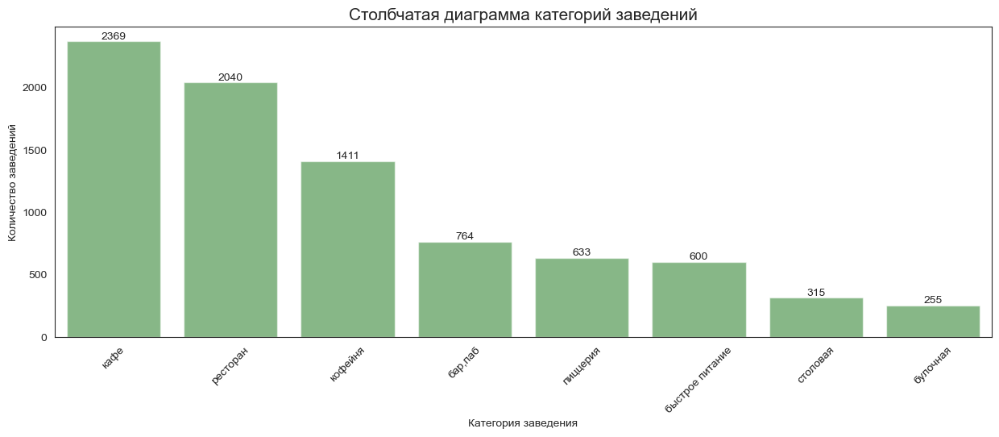

In [28]:
# используем стиль white из библиотеки seaborn
sns.set_style('white')
# назначаем размер графика
plt.figure(figsize=(15, 5))
# Выбираем одноцветную цветовую схему (например, синий)
palette = ['Green']
# строим столбчатый график средствами seaborn
sns.barplot(x='category', y='count', data=category, palette=palette, alpha =0.5)

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Столбчатая диаграмма категорий заведений',fontsize=15)
plt.xlabel('Категория заведения')
plt.ylabel('Количество заведений')
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=45)

# добавляем значения категорий на столбцах
for index, value in enumerate(category['count']):
    plt.text(index, value, str(value), ha='center', va='bottom')
# отображаем график на экране
plt.show()

**Вывод**:

Как видно, из таблицы и диаграммы, всего в датасете представлено 8 категорий объектов общественного питания. Топ -3 категории (в порядке убывания значений):
* кафе (2369);
* ресторан (2040);
* кофейня (1411).

Наименее топ-3 популярные категории (в порядке убывания значений):
* быстрое питание (600);
* столовая (315);
* булочная (255).

**Анализ количества посадочных мест в местах по категориям**

In [29]:
category_seats= df.groupby('category')['seats'].describe().reset_index()
category_seats.sort_values(by='50%',ascending=False)

,category,count,mean,std,min,25%,50%,75%,max
6,ресторан,1268.00,121.95,123.83,0.00,48.00,86.00,150.00,1288.00
0,"бар,паб",467.00,124.48,145.16,0.00,48.00,82.00,148.50,1288.00
4,кофейня,750.00,111.22,127.92,0.00,40.00,80.00,144.00,1288.00
7,столовая,164.00,99.75,122.95,0.00,40.00,75.50,117.00,1200.00
2,быстрое питание,348.00,99.13,106.67,0.00,29.50,67.00,140.75,1040.00
3,кафе,1211.00,97.40,118.13,0.00,35.00,60.00,120.00,1288.00
5,пиццерия,427.00,94.50,112.28,0.00,30.00,55.00,120.00,1288.00
1,булочная,147.00,88.63,97.59,0.00,25.00,50.00,120.00,625.00


По медианному значению посадочных мест лидируют рестораны - 86 посадочных мест, на втором месте - бар,паб (82 посадочных места) и на третьем месте кофейня (80 посадочных места).

Наиболее компактные объекты общественного питания: кафе(60), пиццерия(55) и булочная(50).

Выясним, что за заведения с максимальным количеством посадочных мест 1288.

In [30]:
df[df['seats'] == 1288].reset_index()


,index,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,6518,delonixcafe,ресторан,"москва, проспект вернадского, 94, корп. 1",Западный административный округ,"ежедневно, круглосуточно",55.65,37.48,4.10,высокие,средний счёт:1500–2000 ₽,1750.00,NaN,0,1288.00,проспект вернадского,True
1,6524,ян примус,ресторан,"москва, проспект вернадского, 121, корп. 1",Западный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–02:00; вс 12:00–00:00",55.66,37.48,4.50,выше среднего,средний счёт:1500 ₽,1500.00,NaN,1,1288.00,проспект вернадского,False
2,6574,мюнгер,пиццерия,"москва, проспект вернадского, 97, корп. 1",Западный административный округ,"пн-пт 08:00–21:00; сб,вс 10:00–21:00",55.67,37.49,4.80,NaN,NaN,NaN,NaN,1,1288.00,проспект вернадского,False
3,6641,one price coffee,кофейня,"москва, проспект вернадского, 84, стр. 1",Западный административный округ,"ежедневно, 08:30–20:00",55.67,37.48,4.30,NaN,NaN,NaN,NaN,1,1288.00,проспект вернадского,False
4,6658,гудбар,"бар,паб","москва, проспект вернадского, 97, корп. 1",Западный административный округ,"пн-пт 11:00–23:00; сб,вс 13:00–23:00",55.67,37.49,4.10,средние,средний счёт:700 ₽,700.00,NaN,0,1288.00,проспект вернадского,False
5,6684,пивной ресторан,"бар,паб","москва, проспект вернадского, 121, корп. 1",Западный административный округ,NaN,55.66,37.48,4.50,NaN,NaN,NaN,NaN,0,1288.00,проспект вернадского,False
6,6690,японская кухня,ресторан,"москва, проспект вернадского, 121, корп. 1",Западный административный округ,NaN,55.66,37.48,4.40,NaN,NaN,NaN,NaN,1,1288.00,проспект вернадского,False
7,6771,точка,кафе,"москва, проспект вернадского, 84, стр. 1",Западный административный округ,NaN,55.67,37.48,4.70,NaN,NaN,NaN,NaN,1,1288.00,проспект вернадского,False
8,6807,loft-cafe академия,кафе,"москва, проспект вернадского, 84, стр. 1",Западный административный округ,пн-пт 09:00–20:00; сб 09:00–16:00,55.67,37.48,3.60,NaN,NaN,NaN,NaN,0,1288.00,проспект вернадского,False
9,6808,яндекс лавка,ресторан,"москва, проспект вернадского, 51, стр. 1",Западный административный округ,"ежедневно, круглосуточно",55.67,37.51,4.00,NaN,NaN,NaN,NaN,1,1288.00,проспект вернадского,True


Всего в датасете присутствуют 11 заведений с максимальным количеством посадочных мест 1288. Что удивительно, все они расположены в Западном административном округе на улице Проспект Вернадского. Скорее всего, произошла техническая ошибка и это выбросы. Удалим их из датасета.

In [31]:
df = df.drop(df[df['seats'] == 1288].index)

Для визуализации построим столбчатую диаграмму.

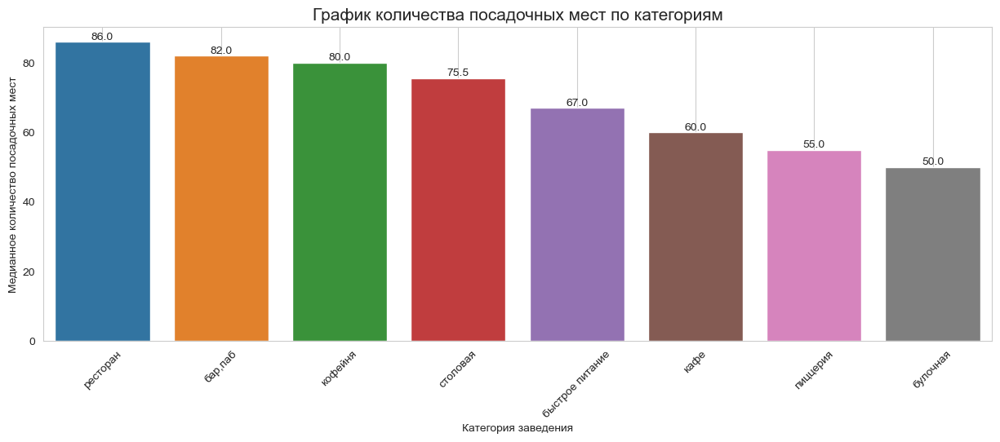

In [32]:

# используем стиль white из библиотеки seaborn
sns.set_style('whitegrid')
# назначаем размер графика
plt.figure(figsize=(15, 5))
# Выбираем одноцветную цветовую схему (например, синий)
palette = ['Green']
# Сортируем DataFrame по столбцу '50%' в порядке убывания
category_seats_sorted = category_seats.sort_values(by='50%', ascending=False)
# строим столбчатый график средствами seaborn
sns.barplot(x='category', y='50%', data=category_seats_sorted)
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('График количества посадочных мест по категориям',fontsize=15)
plt.xlabel('Категория заведения')
plt.ylabel('Медианное количество посадочных мест')
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=45)
# добавляем сетку
plt.grid()
# добавляем значения категорий на столбцах
for index, value in enumerate(category_seats_sorted['50%']):
    plt.text(index, value, str(value), ha='center', va='bottom')
# отображаем график на экране
plt.show()

**Вывод:**

По медианному значению посадочных мест лидируют рестораны - 86 посадочных мест, на втором месте - бар,паб (82 посадочных места) и на третьем месте кофейня (80 посадочных места).

Наиболее компактные объекты общественного питания: кафе(60), пиццерия(55) и булочная(50).

Всего в датасете присутствуют 11 заведений с максимальным количеством посадочных мест 1288. Что удивительно, все они расположены в Западном административном округе на улице Проспект Вернадского. Скорее всего, произошла техническая ошибка и это выбросы. Данные заведения были удалены из датасета.


### Анализ соотношения сетевых и несетевых заведений

In [33]:
df['chain'].value_counts()

0    5182
1    3194
Name: chain, dtype: int64

In [34]:
# Построим круговую диаграмму
chain_category = ['сетевые', 'несетевые']
values =[len(df.query('chain == 1')), len(df.query('chain == 0'))]
fig = go.Figure(data=[go.Pie(labels=chain_category, values=values,pull = [0.1, 0])])
fig.update_layout(title='Cоотношение сетевых и несетевых заведений общественного питания', 
                  width=800, 
                  height=500,
                  annotations=[dict(x=1.15, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Категория',
                                    showarrow=False)])
fig.show() 

Всего в датасете 5182 (61.9%) несетевых и 3194 (38.1%) сетевых заведений.


Рассмотрим далее, какие категории заведений чаще являются сетевыми. Исследуем данные и ответим на вопрос графиком.

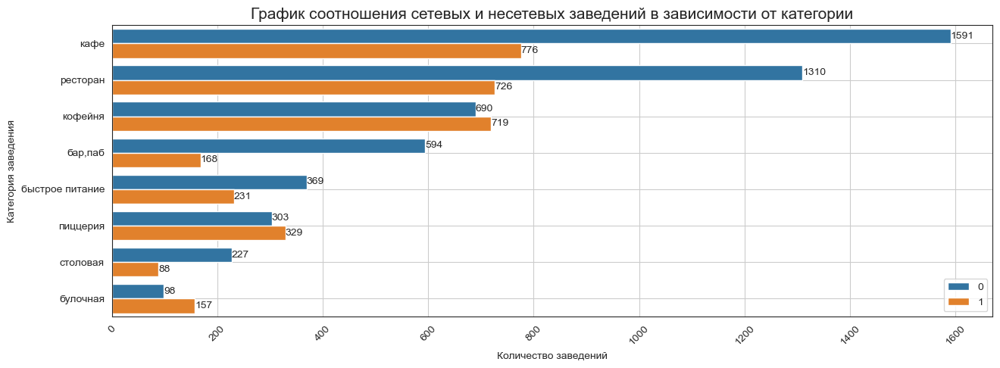

In [35]:
# Сгруппируем данные в датасете по категориям и по принадлежности к сети
chain_objects = df.groupby(['category', 'chain'])['name'].count().reset_index()
chain_objects.columns = ['category', 'chain', 'count']
# Изменим тип данных в солбце для возможности сортировки по нему
chain_objects['chain'] = chain_objects['chain'].astype(object)
chain_objects = chain_objects.sort_values(['count', 'chain'],ascending =False)

# используем стиль dark из библиотеки seaborn
sns.set_style('white')
# назначаем размер графика
plt.figure(figsize=(15, 5))
# строим столбчатый график средствами seaborn
ax = sns.barplot(x='count', y='category', data=chain_objects, hue='chain')

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('График соотношения сетевых и несетевых заведений в зависимости от категории', fontsize=15)
plt.xlabel('Количество заведений')
plt.ylabel('Категория заведения')
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=45)
# выбираем положение легенды и указываем размер шрифта
plt.legend(loc='lower right', fontsize=10)
# добавляем значения
for i, p in enumerate(ax.patches):
    width = p.get_width()
    plt.text(width, p.get_y() + p.get_height() / 2, f'{int(width)}', ha='left', va='center', fontsize=10)
# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show()

Создадим таблицу с категориями и признаком сетевой/несетевой и посчитаем по каждой категории доли, которые составляют сетевые/несетевые заведения.

In [36]:
# Сгруппируем данные в датасете по категориям и по принадлежности к сети
chain_category= df.pivot_table(index='category', columns='chain', values='name', aggfunc='count')
# Переименовываем столбцы
chain_category=chain_category.rename(columns={'0': 'несетевое','1': 'сетевое'}).reset_index()
chain_category.columns = [ 'category', 'no_chain', 'chain']
chain_category=chain_category.sort_values(by='chain', ascending=False)
chain_category['no_chain,%%']=100*chain_category['no_chain']/(chain_category['no_chain']+chain_category['chain'])
chain_category['chain,%%']=100*chain_category['chain']/(chain_category['no_chain']+chain_category['chain'])
chain_category=chain_category.sort_values(by='chain,%%', ascending =False)
chain_category = chain_category.drop (columns = ['no_chain', 'chain'])
chain_category.reset_index(drop=True, inplace=True)
chain_category

,category,"no_chain,%%","chain,%%"
0,булочная,38.43,61.57
1,пиццерия,47.94,52.06
2,кофейня,48.97,51.03
3,быстрое питание,61.50,38.50
4,ресторан,64.34,35.66
5,кафе,67.22,32.78
6,столовая,72.06,27.94
7,"бар,паб",77.95,22.05


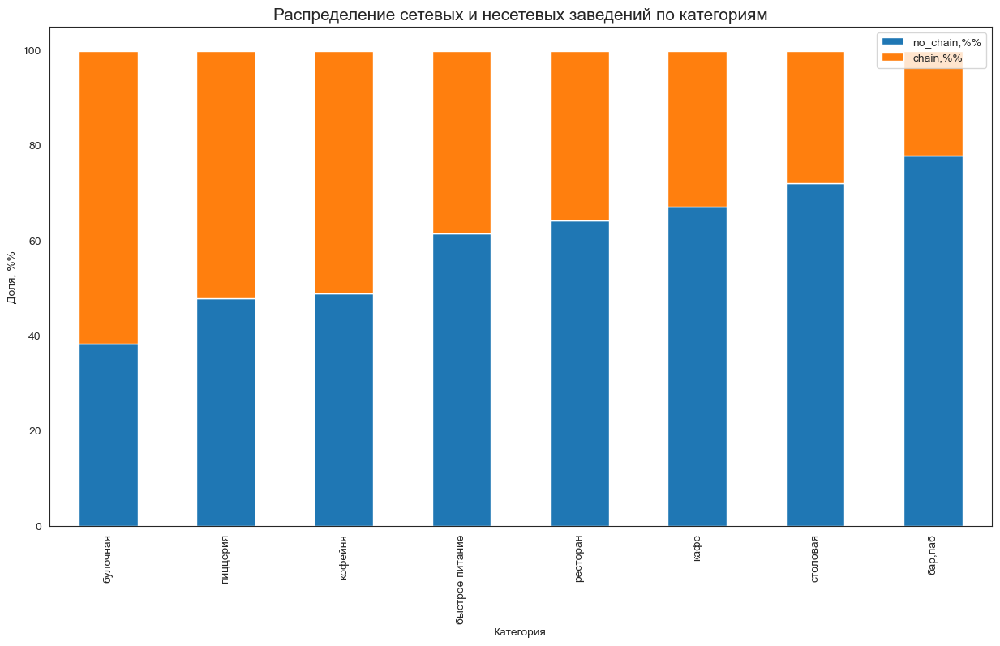

In [37]:
# Устанавливаем столбец 'category' в качестве индекса
chain_category.set_index('category', inplace=True)
# Построим столбчатую диаграмму с разделением по категориям и сетевым/несетевым заведениям
ax = chain_category.plot(kind = 'bar', stacked = True, 
                    title='Распределение сетевых и несетевых заведений по категориям', figsize = (15,8))
plt.title('Распределение сетевых и несетевых заведений по категориям', fontsize=15)
plt.xlabel('Категория')
plt.ylabel('Доля, %%')

plt.show()

**Вывод:**

Всего в датасете 5182 (61.9%) несетевых и 3194 (38.1%) сетевых заведений.

Для большинства категорий заведений справедливо то, что несетевые заведения преобладают над сетевыми.
Однако для булочных(61.6), пиццерий (52.1) и кофеен (51.0) более распространены сетевые заведения.
Менее всего сетевых заведений у баров/пабов (22.1%).

### Топ-15 популярных сетей в Москве

Сгруппируем данные по категориям, названиям заведений и найдем топ-15 популярных сетей в Москве.

In [38]:
top_chains= (df.query('chain == 1').pivot_table(index=['name'], values='chain',aggfunc='sum')
             .sort_values(by='chain', ascending = False)
             .reset_index()
             .rename(columns={'chain': 'chain_count'})
             .head(15)
            )
top_chains        


,name,chain_count
0,шоколадница,120
1,домино'с пицца,76
2,додо пицца,74
3,one price coffee,70
4,яндекс лавка,68
5,cofix,65
6,prime,50
7,хинкальная,44
8,кофепорт,42
9,кулинарная лавка братьев караваевых,39


Топ-5 популярных сетей в Москве (в порядке убывания популярности):
* Шоколадница;
* Домино'с пицца;
* Додо пицца;
* Оne price coffee;
* Яндекс лавка

Скорее всего, в значении сеть Яндекс лавка с категорией "ресторан" занесены данные по разным ресторанам, доставку по которым заказывали через сервис Яндекс лавка.


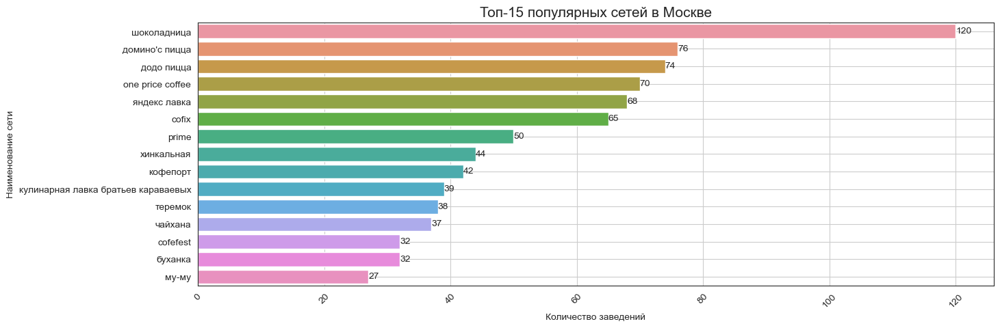

In [39]:
# Построим визуализацию
# используем стиль dark из библиотеки seaborn
sns.set_style('white')
# назначаем размер графика
plt.figure(figsize=(15, 5))
# строим столбчатый график средствами seaborn
ax = sns.barplot(x='chain_count', y='name', data=top_chains)

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Топ-15 популярных сетей в Москве', fontsize=15)
plt.xlabel('Количество заведений')
plt.ylabel('Наименование сети')
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=45)
# добавляем значения категорий на столбцах
for i, p in enumerate(ax.patches):
    width = p.get_width()
    plt.text(width, p.get_y() + p.get_height() / 2, f'{int(width)}', ha='left', va='center', fontsize=10)

# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show()

In [40]:
# Отобразим, к какой категории заведений относятся Топ-15 популярных сетей в Москве 
top_15_category=(df[df['name'].isin(top_chains['name'])].groupby(['category'])
                 .agg(count=('category', 'count'))
                .sort_values(by='count', ascending=False)
                .reset_index())
top_15_category

,category,count
0,кофейня,336
1,ресторан,185
2,пиццерия,152
3,кафе,100
4,булочная,25
5,быстрое питание,12
6,"бар,паб",4
7,столовая,2


In [41]:
# Построим круговую диаграмму, отображающую к какой категории заведений относятся Топ-15 популярных сетей в Москве

fig = go.Figure(data=[go.Pie(labels=top_15_category['category'], values=top_15_category['count'],pull = [0.1, 0])])
fig.update_layout(title='Cоотношение топ-15 популярных сетей в Москве по категориям', 
                  width=800, 
                  height=500,
                  annotations=[dict(x=1.15, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Категория',
                                    showarrow=False)])
fig.show() 

По категориям в топ-15 популярных сетей в Москве лидируют кофейни, рестораны и пиццерии.


**Вывод:**
Топ-5 популярных сетей в Москве (в порядке убывания популярности):
* Шоколадница;
* Домино'с пицца;
* Додо пицца;
* Оne price coffee;
* Яндекс лавка

Скорее всего, в значении сеть Яндекс лавка с категорией "ресторан" занесены данные по разным ресторанам, доставку по которым заказывали через сервис Яндекс лавка.

По категориям в топ-15 популярных сетей в Москве лидируют кофейни, рестораны и пиццерии.

### Анализ административных округов Москвы, присутствующих в датасете

Отобразим общее количество заведений и количество заведений каждой категории по районам. 

In [42]:
print('Общее количество заведений в датасете:', df['name'].count())

Общее количество заведений в датасете: 8376


In [43]:
district_count=(df.groupby(['district'])
                 .agg(count=('name', 'count'))
                .sort_values(by='count', ascending=False)
                .reset_index())
district_count['share, %%'] = round(100*district_count['count'] / df['name'].count(),2)            
 
                     
district_count

,district,count,"share, %%"
0,Центральный административный округ,2241,26.76
1,Северный административный округ,895,10.69
2,Северо-Восточный административный округ,890,10.63
3,Южный административный округ,890,10.63
4,Западный административный округ,836,9.98
5,Восточный административный округ,795,9.49
6,Юго-Восточный административный округ,712,8.50
7,Юго-Западный административный округ,708,8.45
8,Северо-Западный административный округ,409,4.88


Всего в датасете 9 административных районов Москвы. Наибольшее количество заведений  находится в Центральном административном округе - 2241 заведение (26.76% от общего количества заведений по Москве). На втором и третьем месте Северный административный округ	и Северо-Восточный административный округ соответственно.

Менее всего заведений расположено в округах: Юго-Восточный административный округ, Юго-Западный административный округ и Северо-Западный административный округ.

Проиллюстрируем количество заведений каждой категории по районам. Для этого создадим таблицу и далее построим график.

In [44]:
district_count=(df.groupby(['district', 'category'])
                 .agg(count=('name', 'count'))
                .sort_values(by='count', ascending=False)
                .reset_index())
district_count      

,district,category,count
0,Центральный административный округ,ресторан,670
1,Центральный административный округ,кафе,464
2,Центральный административный округ,кофейня,428
3,Центральный административный округ,"бар,паб",364
4,Юго-Восточный административный округ,кафе,282
...,...,...,...
67,Северо-Западный административный округ,"бар,паб",23
68,Северо-Западный административный округ,столовая,18
69,Юго-Западный административный округ,столовая,17
70,Юго-Восточный административный округ,булочная,13


In [45]:
# Построим визуализацию распределения категорий по округам Москва
fig = px.bar(district_count, # загружаем данные и заново их сортируем
             x='district', # указываем столбец с данными для оси X
             y='count', # указываем столбец с данными для оси Y
             color='category' # добавляем аргумент, который отобразит текст с информацией
                              
            )
# оформляем график
fig.update_layout(title='Распределение количества заведений каждой категории по округам Москвы',
                   xaxis_title='Адм.район',
                   yaxis_title='Количество заведений', 
                  legend=dict(
    title="Категория")
                  )


fig.show() # выводим график

Во всех административных районах города Москвы топ-3 категории заведений: ресторан, кафе и кофейня. В Центральном районе лидирует категория "рестораны" (670 заведений). Во всех остальных районах по количеству лидирует категория "кафе".

В то же время столовых и булочных менее всего расположено в каждом из округов.

**Вывод:**
* Всего в датасете 9 административных районов Москвы. Наибольшее количество заведений  находится в Центральном административном округе - 2241 заведение (26.76% от общего количества заведений по Москве).На втором и третьем месте Северный административный округ и Северо-Восточный административный округ соответственно;
* Менее всего заведений расположено в округах: Юго-Восточный административный округ, Юго-Западный административный округ и Северо-Западный административный округ;
* Во всех административных районах города Москвы топ-3 категории заведений: ресторан, кафе и кофейня. В Центральном районе лидирует категория "рестораны" (670 заведений). Во всех остальных районах по количеству лидирует категория "кафе";
* В то же время столовых и булочных менее всего расположено в каждом из округов.

### Анализ средних рейтингов по категориям

**Распределение средних рейтингов по категориям заведений**

Сгруппируем данные по категориям и найдем средний рейтинг для каждой.

In [46]:
rating_mean=(df.groupby(['category'])
                 .agg(rating_mean=('rating', 'mean'))
                .sort_values(by='rating_mean', ascending=False)
                .reset_index())
rating_mean

,category,rating_mean
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


У всех категорий заведений общественного питания Москвы средний рейтинг не ниже 4, в т.ч. самый высокий средний рейтинг у баров/пабов (4.39), самый низкий - у быстрого питания (4.05).

Посмотрим данные с медианным значением рейтинга.


In [47]:
rating_median=(df.groupby(['category'])
                 .agg(rating_median=('rating', 'median'))
                .sort_values(by='rating_median', ascending=False)
                .reset_index())
rating_median

,category,rating_median
0,"бар,паб",4.40
1,булочная,4.30
2,кофейня,4.30
3,пиццерия,4.30
4,ресторан,4.30
5,столовая,4.30
6,быстрое питание,4.20
7,кафе,4.20


   Рейтинги заведений по медианному значению не сильно отличаются от среднего значения. Наивысший рейтинг опять у у баров/пабов (4.4), самый низкий поделили быстрое питание и кафе (по 4.20).
   
   Визуализируем распределение средних рейтингов по категориям заведений.

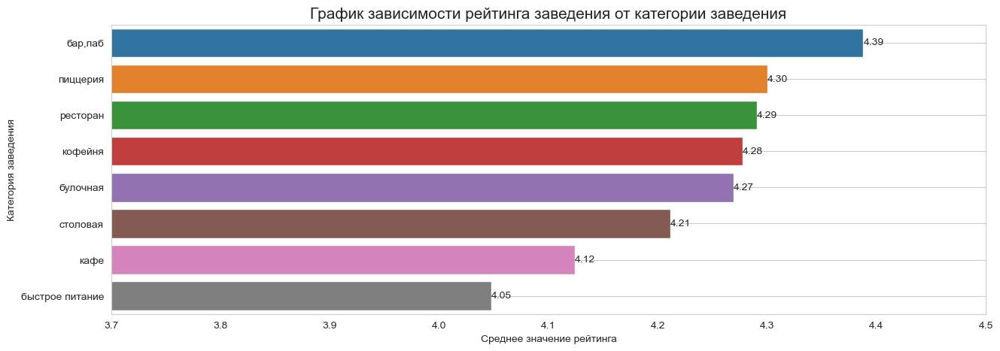

In [48]:
# Используем стиль white из библиотеки seaborn
sns.set_style('whitegrid')

# Назначаем размер графика
plt.figure(figsize=(15, 5))

# Строим столбчатый график средствами seaborn, меняем местами x и y
sns.barplot(x='rating_mean', y='category', data=rating_mean)

# Формируем заголовок графика и подписи осей средствами matplotlib
plt.title('График зависимости рейтинга заведения от категории заведения', fontsize=15)
plt.xlabel('Среднее значение рейтинга')
plt.ylabel('Категория заведения')

# Ограничиваем диапазон значений по оси Y
plt.xlim(3.7, 4.5)

# Добавляем сетку
plt.grid()

# Добавляем значения рейтинга на столбцах
for index, value in enumerate(rating_mean['rating_mean']):
    plt.text(value, index, f'{value:.2f}', ha='left', va='center', fontsize=10)

# Отображаем график на экране
plt.show()

In [49]:
# Добавим к сгруппированным по категориям и рейтингам данные признак price — категория цен 
# в заведении, например «средние», «ниже среднего», «выше среднего» и так далее
rating_mean_2=(df.groupby(['category', 'price'])
                 .agg(rating_mean=('rating', 'mean'))
                .sort_values(by='rating_mean', ascending=False)
                .reset_index())
rating_mean_2

,category,price,rating_mean
0,"бар,паб",высокие,4.49
1,ресторан,высокие,4.47
2,пиццерия,высокие,4.45
3,кофейня,высокие,4.44
4,"бар,паб",выше среднего,4.43
5,"бар,паб",средние,4.41
6,кафе,выше среднего,4.40
7,булочная,высокие,4.40
8,ресторан,выше среднего,4.37
9,булочная,выше среднего,4.35


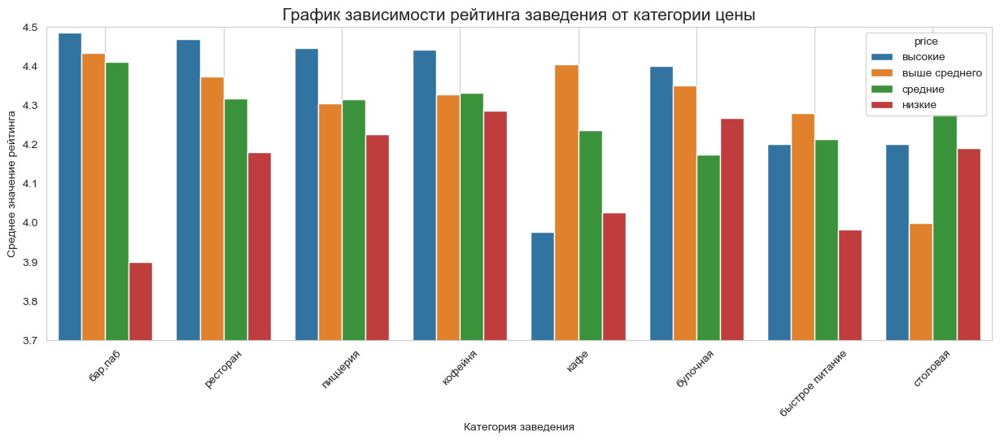

In [50]:
# используем стиль white из библиотеки seaborn
sns.set_style('whitegrid')
# назначаем размер графика
plt.figure(figsize=(15, 5))
# строим столбчатый график средствами seaborn
sns.barplot(x='category', y='rating_mean', data=rating_mean_2, hue='price')
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('График зависимости рейтинга заведения от категории цены',fontsize=15)
plt.xlabel('Категория заведения')
plt.ylabel('Среднее значение рейтинга')
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=45)
plt.ylim(3.7, 4.5)
# добавляем сетку
plt.grid()

# отображаем график на экране
plt.show()

Если добавить признак по ценам, то распределение средних рейтингов по категориям заведений отличается.
Так, в заведениях, где низкие цены, самый высокий средний рейтинг у кофеен (4.29), самый низкий - у баров/пабов (3.90). 
У заведений с высокими, выше среднего и средними ценами наивысший рейтинг у баров/пабов.

**Вывод:**

* У всех категорий заведений общественного питания Москвы средний рейтинг не ниже 4, в т.ч. самый высокий средний рейтинг у баров/пабов (4.39), самый низкий - у быстрого питания (4.05);
* Рейтинги заведений по медианному значению не сильно отличаются от среднего значения. Наивысший рейтинг опять у баров/пабов (4.4), самый низкий поделили быстрое питание и кафе (по 4.20);
* Если добавить признак по ценам, то распределение средних рейтингов по категориям заведений отличается. Так, в заведениях, где низкие цены, самый высокий средний рейтинг у кофеен (4.29), самый низкий - у баров/пабов (3.90). У заведений с высокими, выше среднего и средними ценами наивысший рейтинг у баров/пабов.


**Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района**

Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson.

In [51]:
# Для каждого округа посчитаем средний рейтинг заведений, которые находятся на его территории
rating_df = df.groupby('district', as_index=False)['rating'].agg('mean')
rating_df

# читаем файл и сохраняем в переменной
with open('Yandex-Praktikum-projects/Catering_research_coffe_open/admin_level_geomap.geojson','r', encoding="utf-8") as f:
    geo_json = json.load(f)
    

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

In [52]:
rating_df.sort_values(by='rating', ascending=False)

,district,rating
5,Центральный административный округ,4.38
2,Северный административный округ,4.24
4,Северо-Западный административный округ,4.21
8,Южный административный округ,4.18
1,Западный административный округ,4.18
0,Восточный административный округ,4.17
7,Юго-Западный административный округ,4.17
3,Северо-Восточный административный округ,4.15
6,Юго-Восточный административный округ,4.10


**Вывод:**
Наивысший средний рейтинг у заведений Центрального административного округа; наименьший у Юго-Восточного административного округа.	


**Отобразим все заведения датасета на карте с помощью кластеров**

In [53]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

In [54]:
q_names_df = df.groupby('district', as_index=False)['name'].agg('count').sort_values(by='name', ascending=False)
q_names_df.reset_index(drop=True, inplace=True)
q_names_df

,district,name
0,Центральный административный округ,2241
1,Северный административный округ,895
2,Северо-Восточный административный округ,890
3,Южный административный округ,890
4,Западный административный округ,836
5,Восточный административный округ,795
6,Юго-Восточный административный округ,712
7,Юго-Западный административный округ,708
8,Северо-Западный административный округ,409


**Вывод:**
Основное количество заведений сконцентрировано в Центральном административном округе Москвы; менее всего заведений Северо-Западном административном округе Москвы.

### Топ-15 улиц по количеству заведений

В первую очередь найдем топ 15 улиц по количеству заведений без деления по категориям.

In [55]:
top_street_df = df.groupby('street', as_index=False)['name'].agg('count').sort_values(by='name', ascending=False)
top_15_street=top_street_df.head(15)
top_15_street.reset_index(drop=True, inplace=True)
top_15_street

,street,name
0,проспект мира,183
1,профсоюзная улица,122
2,ленинский проспект,107
3,проспект вернадского,97
4,ленинградский проспект,95
5,дмитровское шоссе,88
6,каширское шоссе,77
7,варшавское шоссе,76
8,ленинградское шоссе,70
9,мкад,64


In [56]:
print('Общее количество заведений на улицах с максимальным количеством заведений: ',top_15_street['name'].sum(), 'что составляет', round(100*top_15_street['name'].sum()/8406,0), '% от общего количества заведений Москвы.')

Общее количество заведений на улицах с максимальным количеством заведений:  1243 что составляет 15.0 % от общего количества заведений Москвы.


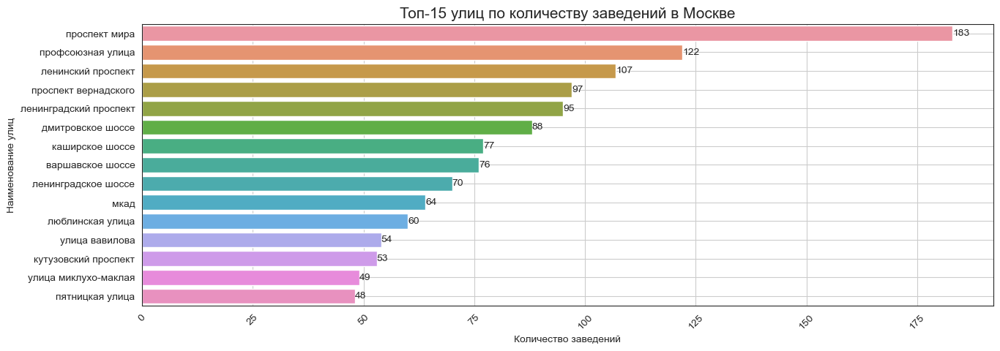

In [57]:
# Построим визуализацию
# используем стиль dark из библиотеки seaborn
sns.set_style('white')
# назначаем размер графика
plt.figure(figsize=(15, 5))
# строим столбчатый график средствами seaborn
ax = sns.barplot(x='name', y='street', data=top_15_street)

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Топ-15 улиц по количеству заведений в Москве', fontsize=15)
plt.xlabel('Количество заведений')
plt.ylabel('Наименование улиц')
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=45)
# добавляем значения категорий на столбцах
for i, p in enumerate(ax.patches):
    width = p.get_width()
    plt.text(width, p.get_y() + p.get_height() / 2, f'{int(width)}', ha='left', va='center', fontsize=10)

# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show()

In [58]:
# Запишем топ улицы в переменную top_15
top_15 = top_15_street['street']
# Сгруппируем по топ-15 улицам и по категориям данные
streets15_category = (df.query('street in @top_15')
                      .groupby(['street', 'category'])
                      .agg(count_names=('name', 'count')).sort_values(by='count_names', ascending=False)
                      .reset_index()
                     )
streets15_category


,street,category,count_names
0,проспект мира,кафе,53
1,мкад,кафе,45
2,проспект мира,ресторан,45
3,проспект мира,кофейня,36
4,профсоюзная улица,кафе,35
...,...,...,...
106,люблинская улица,пиццерия,1
107,проспект вернадского,булочная,1
108,мкад,столовая,1
109,кутузовский проспект,булочная,1


Построим график распределения количества заведений и их категорий по этим улицам.

In [59]:
fig = px.bar(streets15_category, # загружаем данные и заново их сортируем
             x='street', # указываем столбец с данными для оси X
             y='count_names', # указываем столбец с данными для оси Y
             color='category' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Топ-15 улиц по количеству и категориям заведений общественного питания',
                   xaxis_title='Улицы',
                   yaxis_title='Количество заведений',
                  legend_title_text="Категория",
                 xaxis = {"categoryorder":"total descending"})
                  
                                 
           

fig.show() # выводим график

In [60]:
print('Распределение заведений по категориям на топ-15 улицах с максимальным количеством заведений: \n', 
      streets15_category.groupby('category', as_index=False)['count_names'].agg('sum').sort_values(by='count_names', ascending=False))

Распределение заведений по категориям на топ-15 улицах с максимальным количеством заведений: 
           category  count_names
3             кафе          351
6         ресторан          322
4          кофейня          217
2  быстрое питание          116
0          бар,паб           88
5         пиццерия           83
7         столовая           40
1         булочная           26


**Вывод:**
Общее количество заведений на улицах с максимальным количеством заведений:  1243, что составляет 15.0 % от общего количества заведений Москвы.

*Топ-15 улиц:*
* 1) Проспект мира (183);
* 2) Профсоюзная улица (122);
* 3) Ленинский проспект (107);
* 4) Проспект вернадского	(97);
* 5) Ленинградский проспект (95);
* 6) Дмитровское шоссе (88);
* 7) Каширское шоссе (77);
* 8) Варшавское шоссе	(76);
* 9) Ленинградское шоссе (70);
* 10) Мкад (64);
* 11) Люблинская улица (60);
* 12) Улица Вавилова (54);
* 13) Кутузовский проспект (53);
* 14) Улица миклухо-маклая (49);
* 15)Пятницкая улица	(48).

Больше всего на топ-15 улиц по количеству заведений расположено кафе, ресторанов и кофеен.


### Улицы, на которых находится только один объект общепита

In [61]:
# Улицы с одним заведением общественного питания
one_cafe_street = (df
                   .groupby('street').agg(count=('name', 'count'))
                    .sort_values(by='count', ascending=False)
                   .reset_index()
                                         )
print('Число улиц с одним объектом общественного питания:',  len(one_cafe_street[one_cafe_street['count']==1]))

Число улиц с одним объектом общественного питания: 458


In [62]:
# Преобразуем названия улиц с 1 заведением в список
street_1 = one_cafe_street[one_cafe_street['count']==1]['street'].tolist()
# фильтруем изначальные данные, оставляем в нем только строки с улицами на которых по одному заведению общепита
one_cafe_street_1 = df[df['street'].isin(street_1)].reset_index()
# Удалим столбец first_word
one_cafe_street_1=one_cafe_street_1.drop(['index'], axis =1)
one_cafe_street_1.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,дом обеда,столовая,"москва, улица бусиновская горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.89,37.49,4.10,средние,средний счёт:300–500 ₽,400.00,NaN,0,180.00,улица бусиновская горка,False
1,7/12,кафе,"москва, прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.46,4.50,NaN,NaN,NaN,NaN,0,NaN,прибрежный проезд,False
2,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.88,37.46,4.30,NaN,NaN,NaN,NaN,1,NaN,парк левобережный,False
3,coffeekaldi's,кофейня,"москва, угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.90,37.57,4.10,средние,средний счёт:500–800 ₽,650.00,NaN,1,NaN,угличская улица,False
4,чебуречная история,кофейня,"москва, ландшафтный заказник лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.90,37.57,4.90,NaN,NaN,NaN,NaN,1,NaN,ландшафтный заказник лианозовский,False


In [63]:
# Выведем общую игформацию по улицам, на которых находится только один объект общепита.
one_cafe_street_1.describe().T

,count,mean,std,min,25%,50%,75%,max
lat,458.00,55.76,0.06,55.58,55.73,55.76,55.80,55.91
lng,458.00,37.62,0.09,37.39,37.56,37.61,37.67,37.87
rating,458.00,4.24,0.46,1.00,4.10,4.30,4.50,5.00
middle_avg_bill,165.00,959.83,999.52,67.00,325.00,625.00,1250.00,7000.00
middle_coffee_cup,24.00,186.17,55.54,95.00,140.00,177.50,213.75,320.00
chain,458.00,0.29,0.45,0.00,0.00,0.00,1.00,1.00
seats,157.00,60.01,49.42,0.00,30.00,45.00,80.00,240.00


Посмотрим, какие категории заведений встречаются на улицах с одним заведением общественного питания.

In [64]:
one_cafe_street_1['category'].value_counts()

кафе               160
ресторан            93
кофейня             84
бар,паб             39
столовая            36
быстрое питание     23
пиццерия            15
булочная             8
Name: category, dtype: int64

Построим столбчатую диаграмму.

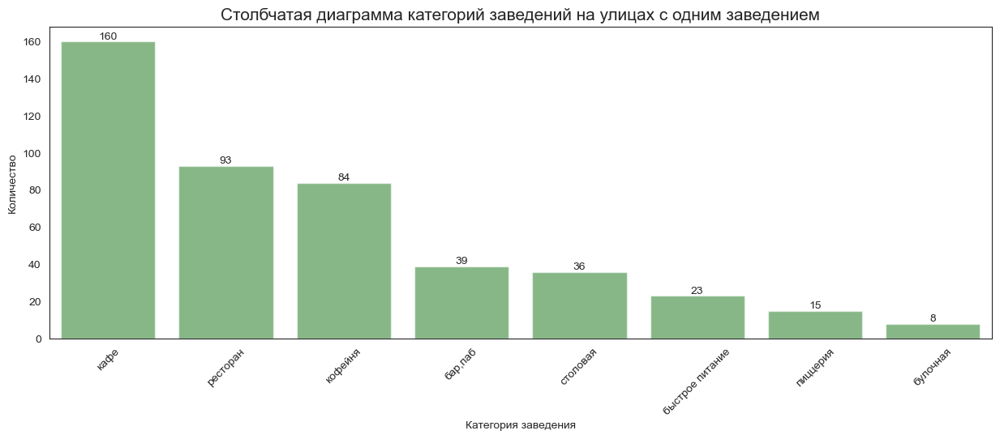

In [65]:
one_cafe_street_category=(one_cafe_street_1.groupby('category').agg(count=('name', 'count'))
                    .sort_values(by='count', ascending=False)
                   .reset_index()
                         )
# используем стиль white из библиотеки seaborn
sns.set_style('white')
# назначаем размер графика
plt.figure(figsize=(15, 5))
# Выбираем одноцветную цветовую схему (например, синий)
palette = ['Green']
# строим столбчатый график средствами seaborn
sns.barplot(x='category', y='count', data=one_cafe_street_category, palette=palette, alpha=0.5)
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Столбчатая диаграмма категорий заведений на улицах с одним заведением',fontsize=15)
plt.xlabel('Категория заведения')
plt.ylabel('Количество')
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=45)

# добавляем значения категорий на столбцах
for index, value in enumerate(one_cafe_street_category['count']):
    plt.text(index, value, f'{value:.0f}', ha='center', va='bottom', fontsize=10)
# отображаем график на экране
plt.show()

Наиболее часто на  улицах с одним заведением расположены кафе (160), меньше всего булочные (8).

Посмотрим распределение рейтингов  у этих заведений.

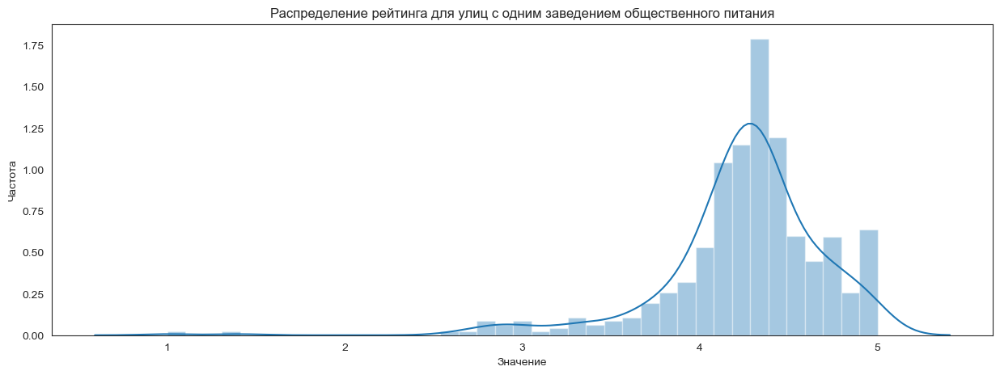

In [66]:
plt.figure(figsize=(15, 5)) 
sns.distplot(one_cafe_street_1['rating'], kde=True) 
# указываем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение рейтинга для улиц с одним заведением общественного питания')
plt.xlabel('Значение')
plt.ylabel('Частота')
# отображаем график на экране
plt.show()



Наибольшее количество заведений на улицах, где находится только один объект общепита, имеют рейтинг от 4.1 до 4.5.

In [67]:
# Посмотрим распределение улиц с одним заведением общественного питания по округам Москвы.
one_cafe_street_1['district'].value_counts()

Центральный административный округ         145
Северо-Восточный административный округ     55
Восточный административный округ            52
Северный административный округ             51
Южный административный округ                43
Юго-Восточный административный округ        39
Западный административный округ             36
Северо-Западный административный округ      19
Юго-Западный административный округ         18
Name: district, dtype: int64

Наибольшее количество заведений на улицах с одним заведением общественного питания находятся в Центральном административном округе (145), менее всего в Юго-Западном административном округе (18).  

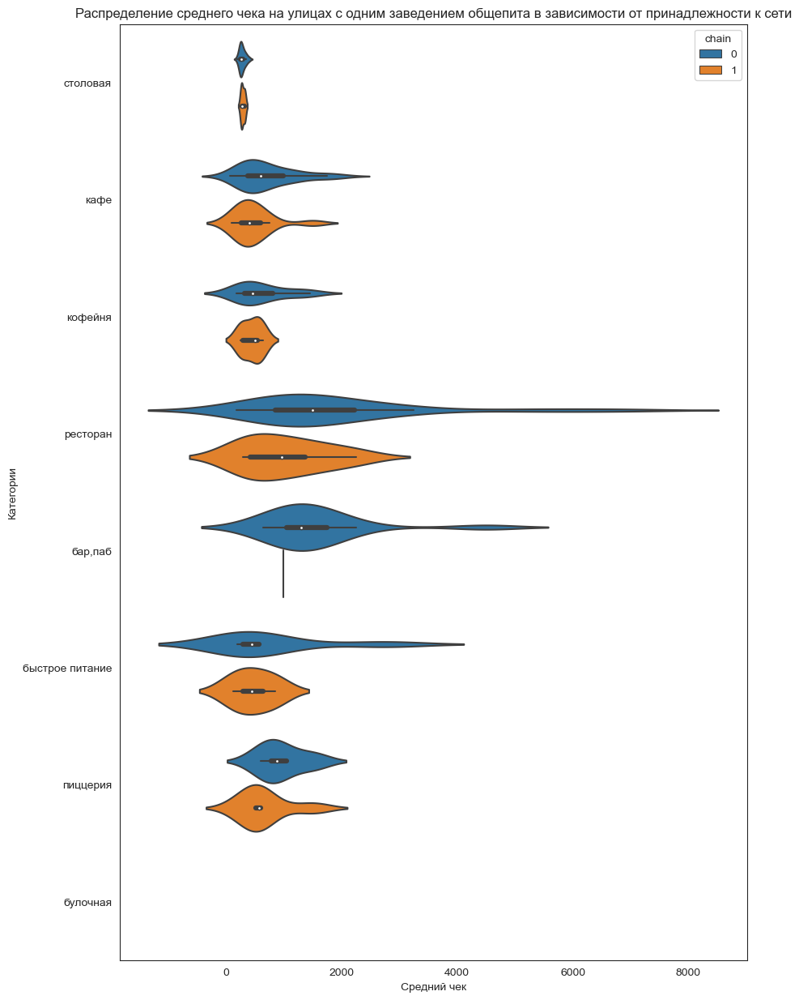

In [68]:
plt.figure(figsize=(10, 15))
sns.violinplot(x='middle_avg_bill', y='category', hue='chain',  data=one_cafe_street_1) 

# указываем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение среднего чека на улицах с одним заведением общепита в зависимости от принадлежности к сети')
plt.xlabel('Средний чек')
plt.ylabel('Категории')


# отображаем график на экране
plt.show()


На улицах с одним заведением общепита по среднему чеку лидируют  несетевые рестораны и бары/пабы. Самый низкий чек у столовых.

**Вывод:**

*Улицы Москвы с одним объектом общественного питания:*
* Число таких улиц: 458;
* Наиболее часто здесь расположены кафе (160), меньше всего булочные (8);
* Наибольшее количество заведений имеют рейтинг от 4.1 до 4.5;
* Наибольшее количество улиц находятся в Центральном административном округе (145), менее всего в Юго-Западном административном округе (18);
* По среднему чеку лидируют несетевые рестораны и бары/пабы. Самый низкий чек у столовых.

### Значения средних чеков заведений

Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитаем медиану этого столбца для каждого района. Используем это значение в качестве ценового индикатора района. Построим фоновую картограмму (хороплет) с полученными значениями для каждого района.

In [69]:
median_bill = df.groupby('district')['middle_avg_bill'].median().sort_values(ascending=False).reset_index()
median_bill

,district,middle_avg_bill
0,Западный административный округ,1000.00
1,Центральный административный округ,1000.00
2,Северо-Западный административный округ,700.00
3,Северный административный округ,650.00
4,Юго-Западный административный округ,600.00
5,Восточный административный округ,575.00
6,Северо-Восточный административный округ,500.00
7,Южный административный округ,500.00
8,Юго-Восточный административный округ,450.00


Построим фоновую картограмму (хороплет) с полученными значениями для каждого района.

In [70]:
# читаем и загружаем JSON-файл с границами округов Москвы и сохраняем в переменной
with open('Yandex-Praktikum-projects/Catering_research_coffe_open/admin_level_geomap.geojson', 'r', encoding="utf-8") as f:
    geo_json = json.load(f)

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=median_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний чек по районам',
).add_to(m)

# выводим карту
m

Топ-3 округа по медианному среднему чеку по всем категориям - Центральный административный округ (1000 руб./чел.), Западный административный округ(1000 руб./чел.) и Северо-Западный административный округ(700 руб./чел.). Удалённость от центра уменьшает средний чек в заведениях, за исключением Западного административного округа.

Построим боксплот для распределения среднего чека по всем заведениям по округам.

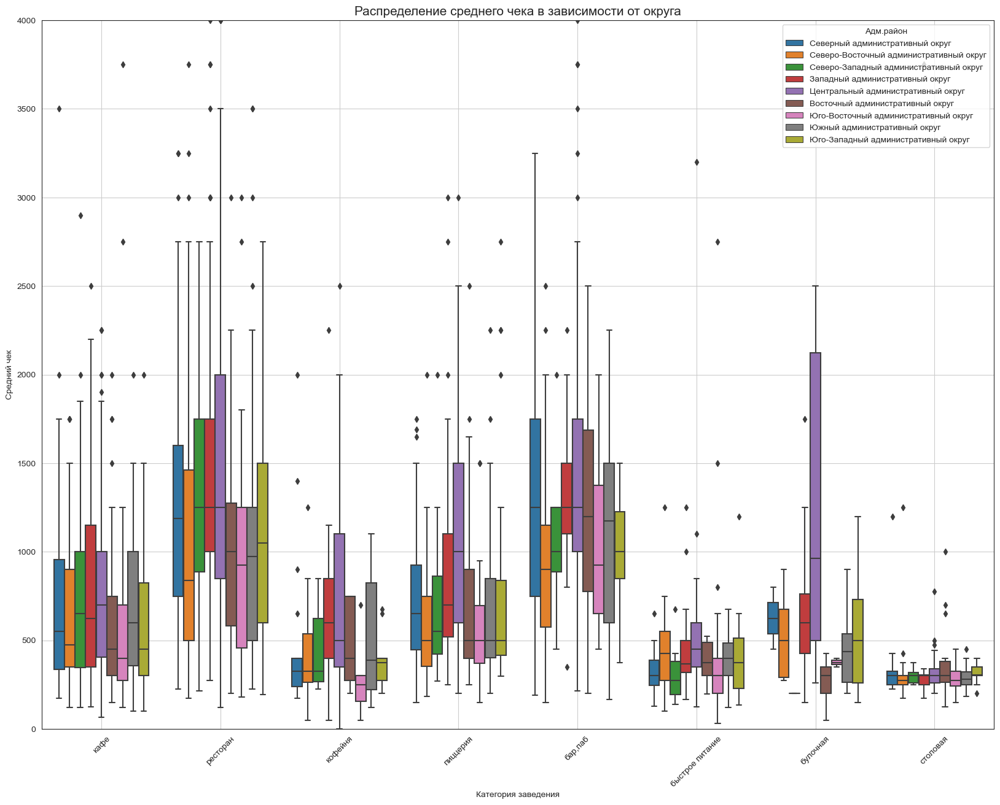

In [71]:
plt.figure(figsize=(20, 15))

ax = sns.boxplot(x='category', y='middle_avg_bill', hue='district', data=df) 

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение среднего чека в зависимости от округа',fontsize=15)
plt.xlabel('Категория заведения')
plt.ylabel('Средний чек')
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=45)

# ограничиваем ось y для наглядности
plt.ylim(0, 4000)

# Переименовываем название легенды
ax.legend(title='Адм.район')

plt.grid()

plt.show()

In [72]:
median_bill_district=(df.groupby(['district', 'category'])
                      .agg(median=('middle_avg_bill', 'median'))
                      .sort_values(by='median',ascending=False)
                      .reset_index()
                     )
median_bill_district

,district,category,median
0,Западный административный округ,ресторан,1250.00
1,Северо-Западный административный округ,ресторан,1250.00
2,Центральный административный округ,"бар,паб",1250.00
3,Центральный административный округ,ресторан,1250.00
4,Северный административный округ,"бар,паб",1250.00
...,...,...,...
67,Северо-Восточный административный округ,столовая,275.00
68,Северо-Западный административный округ,быстрое питание,275.00
69,Юго-Восточный административный округ,столовая,275.00
70,Юго-Восточный административный округ,кофейня,250.00


Медианный средний чек по категориям по округам различается. По всем категориям, кроме ресторанов и баров/пабов, медианный средний чек самый высокий в Центральном административном округе. 
В категории рестораны наивысшие медианные средние чеки у Центрального, Западного и  Северо-Западного округа - по  1250 руб./чел.
В категории бары/пабы наивысшие медианные средние чеки у Центрального, Западного и  Северного округа - по  1250 руб./чел.

**Вывод:**
* Топ-3 округа по медианному среднему чеку по всем категориям - Центральный административный округ (1000 руб./чел.), Западный административный округ(1000 руб./чел.) и Северо-Западный административный округ(700 руб./чел.). Удалённость от центра уменьшает средний чек в заведениях, за исключением Западного административного округа;
* Медианный средний чек по категориям по округам различается. По всем категориям, кроме ресторанов и баров/пабов, медианный средний чек самый высокий в Центральном административном округе. В категории рестораны наивысшие медианные средние чеки у Центрального, Западного и Северо-Западного округа - по 1250 руб./чел. В категории бары/пабы наивысшие медианные средние чеки у Центрального, Западного и Северного округа - по 1250 руб./чел.

### Зависимость среднего чека и категории  от рейтинга заведения (дополнительный вопрос)

In [73]:
# Зависимость среднего чека от рейтинга заведения

fig = px.scatter(df,             # загружаем данные
                 x='middle_avg_bill', # указываем столбец с данными для оси X
                 y='rating' # указываем столбец с данными для оси Y
                 ) # обозначаем категорию для разделения цветом
# оформляем график
fig.update_layout(title='Зависимость среднего чека от рейтинга заведения',
                   xaxis_title='Средний чек',
                   yaxis_title='Рейтинг')
# Ограничиваем значения по оси x
fig.update_xaxes(range=[0,12000], autorange=False)  # указываем диапазон значений и отключаем автоматическое масштабирование


fig.show() # выводим график

Высокие рейтинги не зависят от среднего чека заведения. Так, в заведениях с рейтингом 5 разброс цен ниже, чем в заведениях с рейтигом 4.5 и т.д. Низкие рейтинги сосредоточены в основном на уровне среднего чека до 1000 рублей.

In [74]:
bad_rating_category=(df[df['rating']<3.5].groupby(['category'])
                      .agg(rating=('rating', 'median'))
                      .sort_values(by='rating',ascending=False).reset_index()
                     )
bad_rating_category

,category,rating
0,булочная,3.15
1,кофейня,3.10
2,быстрое питание,3.00
3,ресторан,3.00
4,"бар,паб",2.90
5,кафе,2.90
6,столовая,2.90
7,пиццерия,2.80


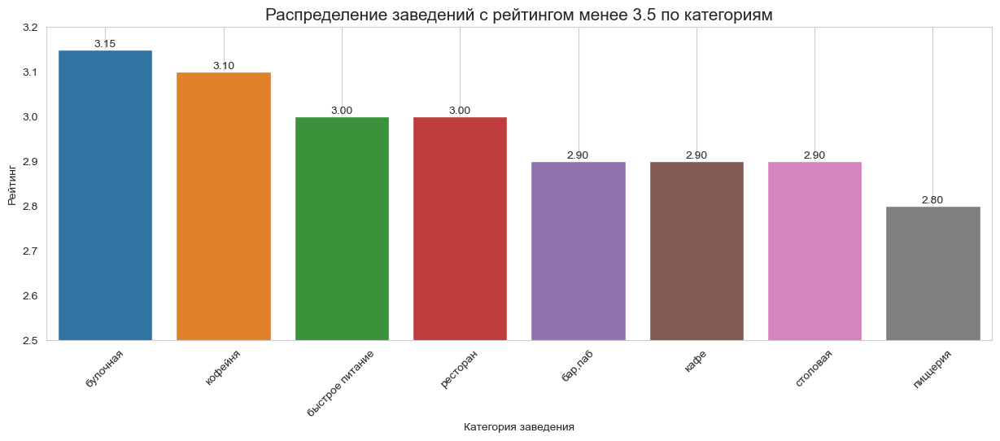

In [75]:
# используем стиль white из библиотеки seaborn
sns.set_style('whitegrid')
# назначаем размер графика
plt.figure(figsize=(15, 5))
# строим столбчатый график средствами seaborn
sns.barplot(x='category', y='rating', data=bad_rating_category)
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение заведений с рейтингом менее 3.5 по категориям',fontsize=15)
plt.xlabel('Категория заведения')
plt.ylabel('Рейтинг')
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=45)
plt.ylim(2.5, 3.2)
# добавляем сетку
plt.grid()
# добавляем значения категорий на столбцах
for index, value in enumerate(bad_rating_category['rating']):
    plt.text(index, value, f'{value:.2f}', ha='center', va='bottom', fontsize=10)
# отображаем график на экране
plt.show()

Среди заведений с плохими рейтингами (<3.5) самый низкий медианный рейтинг у пиццерий (2.8) и столовых, кафе и баров/пабов- по 2.9.

**Вывод:**
* Высокие рейтинги не зависят от среднего чека заведения. Так, в заведениях с рейтингом 5 разброс цен ниже, чем в заведениях с рейтигом 4.5 и т.д. Низкие рейтинги сосредоточены в основном на уровне среднего чека до 1000 рублей;
* Среди заведений с плохими рейтингами (<3.5) самый низкий медианный рейтинг у пиццерий (2.8) и столовых, кафе и баров/пабов- по 2.9.

## Общий вывод

<div style="border: 1px solid black; padding: 20px">
В ходе выполнения проекта было проведено исследование рынка заведений общественного питания Москвы на основе датасета,  составленного на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.

    
  Исследование состояло из нескольких разделов. 
    
   Так,  в ходе <span style="font-size:larger;">**Обзора данных**</span> было установлено, что:
    
1. Файл с данными о заведениях общественного питания Москвы состоит из 8406 строк в 14 столбцах;

2. Количество уникальных заведений:5614;

3. Пропуски в данных присутствуют в следующих столбцах: hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats;

4. Явные дубликаты отсутствуют;

5. Датасет хранит 7 строковых столбцов, 6 численных и 1 целочисленный; 

6. В столбцах middle_avg_bill, middle_coffee_cup, очень большой разброс разброс среднего чека, скорее всего, присутствуют выбросы.
    
В результате <span style="font-size:larger;">**Предобработки данных**</span> было выявлено:
    
**Дубликаты:**

*  Явные дубликаты в датасете отсутствуют;
*  Было удалено 4 дубликата по совпадениям в  столбцах ['name', 'address'];
*  Было удалено 15 дубликатов по первому слову в названии заведения и одинаковым значениям в столбцах ['name', 'address'].

**Пропуски:**
* Пропуски присутствуют в столбцах hours, price, avg_bill, middle_avg_bill, middle_coffee_cup и seats;
* Пропуски по столбцу avg_bill в размере 4571 (54.5%) предлагаю не заполнять, т.к. на средний счет влияет множество факторов (округ, в котором расположено заведение, категория заведения, категория цен в заведении, является ли заведение сетевым);
* Количество заполненных значений по столбцу middle_avg_bill 3149 совпадает с количеством значений в столбце avg_bill, начинающихся с подстроки «Средний счёт», соответственно, оставшиеся пропуски по столбцу middle_avg_bill не подлежат заполнению;
* Количество заполненных значений по столбцу middle_coffee_cup 535 совпадает с количеством значений в столбце avg_bill, начинающихся с подстроки «Цена чашки капучино», соответственно, оставшиеся пропуски по столбцу middle_coffee_cup не подлежат заполнению;
* По столбцу hours (информация о днях и часах работы) количество пропусков несущественно (6.35 %), оставим без изменений;
* По столбцу price (категория цен в заведении) оставим пропуски без изменений,т.к. цифра коррелирует с количеством пропусков по столбцу avg_bill;
* По столбцу seats (количество посадочных мест) оставили без изменений.

**Добавление новых столбцов:**

Добавили 2 новых столбца в датафрейм: 
* столбец street с названиями улиц из столбца с адресом;
* столбец is_24_7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7).
    
<span style="font-size:larger;">**Анализ данных**</span> показал:
    
1. **Анализ категорий заведений:**
    
    Всего в датасете представлено **8 категорий объектов общественного питания**. 
    
Топ -3 категории (в порядке убывания значений):
* кафе (2369);
* ресторан (2040);
* кофейня (1411).

Наименее топ-3 популярные категории (в порядке убывания значений):
* быстрое питание (600);
* столовая (315);
* булочная (255).    
    
    По медианному значению посадочных мест лидируют рестораны - 86 посадочных мест, на втором месте - бар,паб (82 посадочных места) и на третьем месте кофейня (80 посадочных места).

Наиболее компактные объекты общественного питания: кафе(60), пиццерия(55) и булочная(50).

Всего в датасете присутствуют 11 заведений с максимальным количеством посадочных мест 1288. Что удивительно, все они расположены в Западном административном округе на улице Проспект Вернадского. Скорее всего, произошла техническая ошибка и это выбросы. Данные заведения были удалены из датасета.
    
2. **Анализ соотношения сетевых и несетевых заведений:**
    
  Всего в датасете 5182 (61.9%) несетевых и 3194 (38.1%) сетевых заведений.

Для большинства категорий заведений справедливо то, что несетевые заведения преобладают над сетевыми.
Однако для булочных(61.6), пиццерий (52.1) и кофеен (51.0) более распространены сетевые заведения.
Менее всего сетевых заведений у баров/пабов (22.1%).
    
3. **Топ-15 популярных сетей в Москве:**
    
    Топ-5 популярных сетей в Москве (в порядке убывания популярности):

* Шоколадница;
* Домино'с пицца;
* Додо пицца;
* Оne price coffee;
* Яндекс лавка
Скорее всего, в значении сеть Яндекс лавка с категорией "ресторан" занесены данные по разным ресторанам, доставку по которым заказывали через сервис Яндекс лавка.

По категориям в топ-15 популярных сетей в Москве лидируют кофейни, рестораны и пиццерии.
    
4. **Анализ административных округов Москвы, присутствующих в датасете:**    
    
* Всего в датасете 9 административных районов Москвы. Наибольшее количество заведений  находится в Центральном административном округе - 2241 заведение (26.76% от общего количества заведений по Москве).На втором и третьем месте Северный административный округ и Северо-Восточный административный округ соответственно;
* Менее всего заведений расположено в округах: Юго-Восточный административный округ, Юго-Западный административный округ и Северо-Западный административный округ;
* Во всех административных районах города Москвы топ-3 категории заведений: ресторан, кафе и кофейня. В Центральном районе лидирует категория "рестораны" (670 заведений). Во всех остальных районах по количеству лидирует категория "кафе";
* В то же время столовых и булочных менее всего расположено в каждом из округов.
    
5. **Анализ средних рейтингов по категориям:**        
* У всех категорий заведений общественного питания Москвы средний рейтинг не ниже 4, в т.ч. самый высокий средний рейтинг у баров/пабов (4.39), самый низкий - у быстрого питания (4.05);
* Рейтинги заведений по медианному значению не сильно отличаются от среднего значения. Наивысший рейтинг опять  у баров/пабов (4.4), самый низкий поделили быстрое питание и кафе (по 4.20);
* Если добавить признак по ценам, то распределение средних рейтингов по категориям заведений отличается. Так, в заведениях, где низкие цены, самый высокий средний рейтинг у кофеен (4.29), самый низкий - у баров/пабов (3.90). У заведений с высокими, выше среднего и средними ценами наивысший рейтинг у баров/пабов;
* Наивысший средний рейтинг у заведений Центрального административного округа; наименьший у Юго-Восточного административного округа;
* Основное количество заведений сконцентрировано в Центральном административном округе Москвы; менее всего заведений Северо-Западном административном округе Москвы.

6. **Топ-15 улиц по количеству заведений:**   
    
    Общее количество заведений на улицах с максимальным количеством заведений:  1243, что составляет 15.0 % от общего количества заведений Москвы.

  *Топ-15 улиц:*
* 1) Проспект мира (183);
* 2) Профсоюзная улица (122);
* 3) Ленинский проспект (107);
* 4) Проспект вернадского	(97);
* 5) Ленинградский проспект (95);
* 6) Дмитровское шоссе (88);
* 7) Каширское шоссе (77);
* 8) Варшавское шоссе	(76);
* 9) Ленинградское шоссе (70);
* 10) Мкад (64);
* 11) Люблинская улица (60);
* 12) Улица Вавилова (54);
* 13) Кутузовский проспект (53);
* 14) Улица миклухо-маклая (49);
* 15)Пятницкая улица	(48).

Больше всего на топ-15 улиц по количеству заведений расположено кафе, ресторанов и кофеен.
    
    
7. **Улицы, на которых находится только один объект общепита:**  
  
    
1. Число таких улиц: 458;
2. Наиболее часто здесь расположены кафе (160), меньше всего булочные (8);
3. Наибольшее количество заведений имеют рейтинг от 4.1 до 4.5;
4.Наибольшее количество улиц находятся в Центральном административном округе (145), менее всего в Юго-Западном административном округе (18);
5. По среднему чеку лидируют несетевые рестораны и бары/пабы. Самый низкий чек у столовых.    
 
    
8. **Значения средних чеков заведений:** 
    
* Топ-3 округа по медианному среднему чеку по всем категориям - Центральный административный округ (1000 руб./чел.), Западный административный округ(1000 руб./чел.) и Северо-Западный административный округ(700 руб./чел.). Удалённость от центра уменьшает средний чек в заведениях, за исключением Западного административного округа;
* Медианный средний чек по категориям по округам различается. По всем категориям, кроме ресторанов и баров/пабов, медианный средний чек самый высокий в Центральном административном округе. В категории рестораны наивысшие медианные средние чеки у Центрального, Западного и Северо-Западного округа - по 1250 руб./чел. В категории бары/пабы наивысшие медианные средние чеки у Центрального, Западного и Северного округа - по 1250 руб./чел.
    
    
9. **Зависимость среднего чека и категории от рейтинга заведения:** 
 
* Высокие рейтинги не зависят от среднего чека заведения. Так, в заведениях с рейтингом 5 разброс цен ниже, чем в заведениях с рейтигом 4.5 и т.д. Низкие рейтинги сосредоточены в основном на уровне среднего чека до 1000 рублей;
* Среди заведений с плохими рейтингами (<3.5) самый низкий медианный рейтинг у пиццерий (2.8) и столовых, кафе и баров/пабов- по 2.9.    
    
    
    
    
    
    
    
    
    
    
    
    
    
    
</div>


## Дополнительное исследование: <br> Изучение рынка кофеен, выработка рекомендаций по открытию новой кофейни


### Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [76]:
print('Общее количество кофеен в датасете: ',df[df['category']=='кофейня']['name'].agg('count'),',', 
      '\n''что составляет', round(df[df['category']=='кофейня']['name'].agg('count')/8406*100,2),
      '% от общего количества заведений в датасете')

Общее количество кофеен в датасете:  1409 , 
что составляет 16.76 % от общего количества заведений в датасете


In [77]:
# Посмотрим распределение кофеен: сетевые/ несетевые
df[df['category']=='кофейня']['chain'].value_counts()

1    719
0    690
Name: chain, dtype: int64

Сетевых кофеен на 4% больше, чем несетевых.

In [78]:
# Сугруппируем данные по кофейням и посчитаем общее количество в кажом округе Москвы
cofe_df_count=(df[df['category']=='кофейня']
               .groupby('district')['name'].count().sort_values(ascending=False)
               .reset_index()
              )
cofe_df_count

,district,name
0,Центральный административный округ,428
1,Северный административный округ,193
2,Северо-Восточный административный округ,159
3,Западный административный округ,147
4,Южный административный округ,131
5,Восточный административный округ,104
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


In [79]:
df_cofe=df.query('category == "кофейня"')
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}"
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df_cofe.apply(create_clusters, axis=1)

# выводим карту
m

**Вывод:**
* Общее количество кофеен в датасете:  1409, что составляет 16.76 % от общего количества заведений в датасете;
* Наибольшее количество кофеен расположено в Центральном административном округе (428),Северном административном округе (193) и Северо-Восточном административном округе (159);

* Меньше всего кофеен в Юго-Западном административном округе (96), Юго-Восточном  административном округе (89) и Северо-Западном административном округе(62).

### Есть ли круглосуточные кофейни?

In [80]:
df_cofe_24_7=df_cofe.query('is_24_7 == True')
print('Всего круглосуточных кофеен: ',df_cofe_24_7['name'].count(),','
      '\n''что составляет', round(df_cofe_24_7['name'].count()/len(df_cofe)*100,2),
      '% от общего количества кофеен в Москве.')

Всего круглосуточных кофеен:  59 ,
что составляет 4.19 % от общего количества кофеен в Москве.


In [81]:
df_cofe_24_7_count=(df_cofe_24_7.groupby('district')['name']
                    .count().sort_values(ascending=False)
               .reset_index()
                   )
df_cofe_24_7_count

,district,name
0,Центральный административный округ,26
1,Западный административный округ,9
2,Юго-Западный административный округ,7
3,Восточный административный округ,5
4,Северный административный округ,5
5,Северо-Восточный административный округ,3
6,Северо-Западный административный округ,2
7,Юго-Восточный административный округ,1
8,Южный административный округ,1


In [82]:

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df_cofe_24_7.apply(create_clusters, axis=1)

# выводим карту
m

In [83]:
df_cofe['hours'].value_counts()

ежедневно, 10:00–22:00                                                  140
ежедневно, 08:00–22:00                                                   60
ежедневно, круглосуточно                                                 59
ежедневно, 09:00–22:00                                                   57
пн-пт 08:00–19:00                                                        46
                                                                       ... 
пн-чт 11:00–23:00; пт,сб 11:00–02:00; вс 11:00–23:00                      1
пн-пт 09:00–22:00; сб,вс 09:00–23:00                                      1
пн-пт 08:00–18:00; сб,вс 10:00–22:00                                      1
пн 08:00–23:00; вт-пт 08:00–00:00; сб круглосуточно; вс 00:00–23:00       1
пн-ср 11:00–23:00; чт 11:00–00:00; пт,сб 11:00–05:00; вс 11:00–23:00      1
Name: hours, Length: 359, dtype: int64

**Вывод:**

Всего круглосуточных кофеен:  59, что составляет 4.19 % от общего количества кофеен в Москве.

Наибольшее круглосуточных количество кофеен расположено в Центральном административном округе (26), в остальных районах Москвы круглосуточные кофейни представлены в минимальном количестве.

Делаем вывод, что кофейням не свойственен круглосуточное время/ работы. Самый распространенный график работы кофеен - "ежедневно, 10:00–22:00".





### Какие у кофеен рейтинги? Как они распределяются по районам?

In [84]:
df_cofe_rating=(df_cofe.groupby(['district'])
                 .agg(rating_mean=('rating', 'mean'))
                .sort_values(by='rating_mean', ascending=False)
                .reset_index())
df_cofe_rating

,district,rating_mean
0,Центральный административный округ,4.34
1,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
3,Восточный административный округ,4.28
4,Юго-Западный административный округ,4.28
5,Южный административный округ,4.23
6,Юго-Восточный административный округ,4.23
7,Северо-Восточный административный округ,4.22
8,Западный административный округ,4.19


In [85]:
# Построим хороплет
# создаём карту Москвы
m= Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=df_cofe_rating,
    columns=['district', 'rating_mean'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по районам'
).add_to(m)

# выводим карту
m

**Вывод:**

* Средний рейтинг кофеен Москвы находится в диапазоне от 4.19 до 4.34. 
* Самые высокие средние рейтинги в Центральном административном округе (4.34)  и  Северо-Западном административном округе (4.33).
* В остальных районах Москвы средние рейтинги колеблются в диапазоне от 4.19 до 4.29.
* В целом можно сказать ,что посетители лояльно относятся к данной категории заведений общественного питания во всех округах Москвы.
 

### На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [86]:
df_cofe['middle_coffee_cup'].value_counts()

256.00     43
60.00      33
95.00      32
150.00     22
200.00     18
           ..
315.00      1
167.00      1
169.00      1
1568.00     1
129.00      1
Name: middle_coffee_cup, Length: 95, dtype: int64

Построим диаграмму рассеяния стоимости чашки капучино по районам.

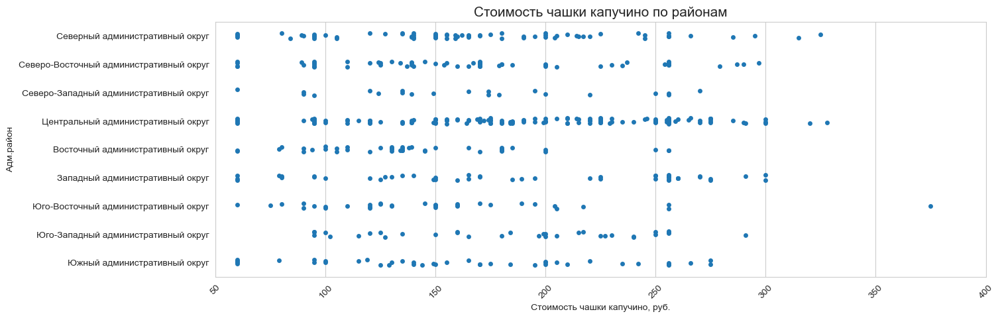

In [87]:
# назначаем размер графика
plt.figure(figsize=(15, 5))
sns.stripplot(y='district', x='middle_coffee_cup', data=df_cofe) 
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=45)
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Стоимость чашки капучино по районам',fontsize=15)
plt.xlabel('Стоимость чашки капучино, руб.')
plt.ylabel('Адм.район')
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=45)


# Ограничение значений по оси x
plt.xlim(50, 400) 

# Отображение графика
plt.show()

Стоимость одной чашки капучино находится в диапазоне от 60 до 256 рублей. Есть заведения и с более дорогой стоимостью одной чашки капучино, но это, скорее всего, одиночные престижные заведения с хорошим рейтингом и репутацией, со сложившейся базой посетителей.

In [88]:
df_cofe_bill=(df_cofe.groupby(['district'])
                 .agg(rating_median=('middle_coffee_cup', 'median'))
                .sort_values(by='rating_median', ascending=False)
                .reset_index())
df_cofe_bill

,district,rating_median
0,Юго-Западный административный округ,198.00
1,Центральный административный округ,190.00
2,Западный административный округ,189.00
3,Северо-Западный административный округ,165.00
4,Северо-Восточный административный округ,162.50
5,Северный административный округ,159.00
6,Южный административный округ,150.00
7,Юго-Восточный административный округ,147.50
8,Восточный административный округ,135.00


* Медианная стоимость одной чашки капучино варьируется по районам от 198 до 135 рублей. Наиболее высокая стоимость чашки капучино в Юго-Западном административном округе (198), Центральном административном округе (190) и Западном административном округе (189);
* Наименьшая медианная стоимость одной чашки капучино Южном административном округе (150), Юго-Восточном административном округе (147.50) и Восточном административном округе (135).


In [89]:
# Построим хороплет
# создаём карту Москвы
m= Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=df_cofe_bill,
    columns=['district', 'rating_median'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Стоимость одной чашки капучино по районам'
).add_to(m)

# выводим карту
m

Построим violinplot(), добавим признак сетевой/несетевой.

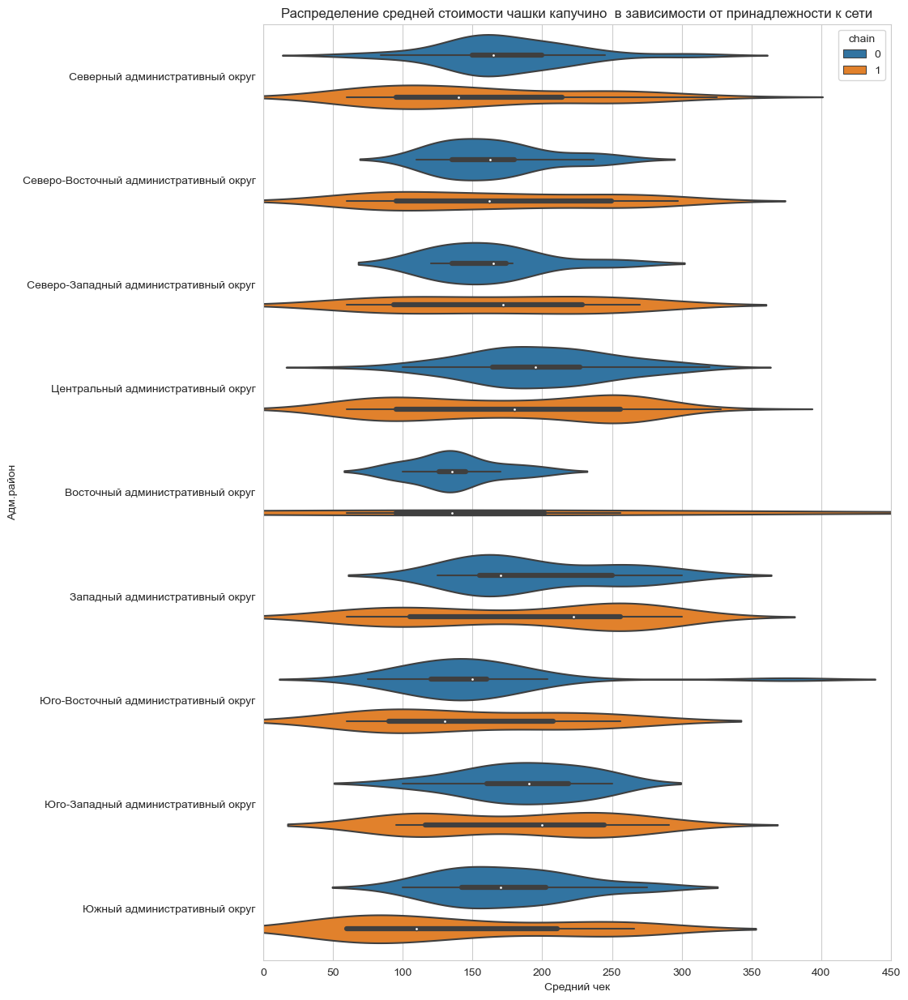

In [90]:
plt.figure(figsize=(10, 15))
sns.violinplot(x='middle_coffee_cup', y='district', hue='chain',  data=df_cofe) 

# указываем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение средней стоимости чашки капучино  в зависимости от принадлежности к сети')
plt.xlabel('Средний чек')
plt.ylabel('Адм.район')
# ограничиваем ось X для наглядности
plt.xlim(0, 450)

# отображаем график на экране
plt.show()

Средняя стоимость одной чашки капучино в несетевых заведениях  от 130 до 250 рублей в зависимости от районов, в сетевых - от 60 до 260. Максимальная средняя стоимость в сетевых в Центральном административном округе  и Западном административном округе; несетевых в Западном административном округе.

**Вывод:**
* Стоимость одной чашки капучино находится в диапазоне от 60 до 256 рублей. Есть заведения и с более дорогой стоимостью одной чашки капучино, но это, скорее всего, одиночные престижные заведения с хорошим рейтингом и репутацией, со сложившейся базой посетителей;
* Медианная стоимость одной чашки капучино варьируется по районам от 135 до 198 рублей. Наиболее высокая стоимость чашки капучино в Юго-Западном административном округе (198), Центральном административном округе (190) и Западном административном округе (189);
* Наименьшая медианная стоимость одной чашки капучино Южном административном округе (150), Юго-Восточном административном округе (147.50) и Восточном административном округе (135);
* Средняя стоимость одной чашки капучино в несетевых заведениях от 130 до 250 рублей в зависимости от районов, в сетевых - от 60 до 260. Максимальная средняя стоимость в сетевых в Центральном административном округе и Западном административном округе; несетевых в Западном административном округе.

### Выводы и рекомендации для открытия новой кофейни

<div style="border: 1px solid black; padding: 20px">
    

    
**Расположение и количество кофеен:**  
    
Общее количество кофеен:  **1409**, что составляет **16.76 % от общего количества заведений в датасете**;
* Наибольшее количество кофеен расположено в Центральном административном округе (428),Северном административном округе (193) и Северо-Восточном административном округе (159);

* Меньше всего кофеен в Юго-Западном административном округе (96), Юго-Восточном  административном округе (89) и Северо-Западном административном округе(62).  

**График работы:**      
* Всего круглосуточных кофеен:  59, что составляет 4.19 % от общего количества кофеен в Москве.

* Наибольшее круглосуточных количество кофеен расположено в Центральном административном округе (26), в остальных районах Москвы круглосуточные кофейни представлены в минимальном количестве.

* Делаем вывод, что кофейням не свойственен круглосуточное время/ работы. **Самый распространенный график работы кофеен - "ежедневно, 10:00–22:00".**

**Рейтинги:** 
    
* Средний рейтинг кофеен Москвы находится в диапазоне от 4.19 до 4.34. 
* Самые высокие средние рейтинги в Центральном административном округе (4.34)  и  Северо-Западном административном округе (4.33).
* В остальных районах Москвы средние рейтинги колеблются в диапазоне от 4.19 до 4.29.
* В целом можно сказать ,что посетители лояльно относятся к данной категории заведений общественного питания, не зависимо  от округа Москвы.    
 
**Стоимость чашки капучино:**    
* Стоимость одной чашки капучино находится в диапазоне от 60 до 256 рублей. Есть заведения и с более дорогой стоимостью одной чашки капучино, но это, скорее всего, одиночные престижные заведения с хорошим рейтингом и репутацией, со сложившейся базой посетителей;
* Медианная стоимость одной чашки капучино варьируется по районам от 135 до 198 рублей. Наиболее высокая стоимость чашки капучино в Юго-Западном административном округе (198), Центральном административном округе (190) и Западном административном округе (189);
* Наименьшая медианная стоимость одной чашки капучино Южном административном округе (150), Юго-Восточном административном округе (147.50) и Восточном административном округе (135);
* Средняя стоимость одной чашки капучино в несетевых заведениях от 130 до 250 рублей в зависимости от районов, в сетевых - от 60 до 260. Максимальная средняя стоимость в сетевых в Центральном административном округе и Западном административном округе; несетевых в Западном административном округе.    
    
<span style="font-size:larger;">**Рекомендации для открытия новой кофейни:**</span> 
    
* Исходя из вышеперечисленного рекомендую  инвесторам обратить внимание на перспективные с точки зрения открытия кофеен **Северо-Западный** и **Юго-Западный административные округа**. 
    
* Указанные округа характеризуются небольшим по сравнению с другими районами количеством кофеен в пределах их территорий (есть перспектива расширения присутствия), а также высоким медианным средним чеком (стоимость одной чашки капучино) - 165 руб и 198 руб. соответственно. 
    
* В датасете отсутствует информация по рынку заведений общественного питания Москвы на **территории Новой Москвы**. Однако, ввиду экстенсивного  развития данной территории рекомендуется проанализировать данный участок для целей изучения перспективы открытия там кофейни. Наверняка территория Новой Москвы, учитывая большую плотность населения, активное развитие транспортной доступности, будет иметь большой потенциал для открытия не только кофейни, но и других категорий заведений.
    
* Рекомендуется установить в кофейне **график работы - "ежедневно, 10:00–22:00"**.
    
    
</div>

## Презентация

Презентация: <https://disk.yandex.ru/i/2blD8kkDhT4bqg>